# Mini Proyecto 1

## Generación de paletas de colores a partir de imágenes con técnicas de machine learning no supervisado

**Curso:** Machine Learning No Supervisado
**Programa:** Maestría en Inteligencia Artificial — Semestre 2
**Entrega:** Mini Proyecto No. 1

### Integrantes

- Juan Avendaño García
- Leonardo Cano Uribe

**Fecha:** Agosto de 2026

# Contenido

0. [Planteamiento del proyecto](#planteamiento)
1. [Conjunto de imágenes](#seccion-1)
   - 1.1 [Criterio de selección](#s1-1) · 1.2 [Configuración](#s1-2) · 1.3 [Fuente de datos](#s1-3)
   - 1.4 [Catálogo](#s1-4) · 1.5 [Selección de obras](#s1-5) · 1.6 [Verificación](#s1-6) · 1.7 [Galería](#s1-7)
2. [Pipeline de preparación](#seccion-2)
   - 2.1 [Decisiones de preparación](#s2-1) · 2.2 [Transformadores](#s2-2) · 2.3 [Pipeline](#s2-3)
   - 2.4 [Verificación numérica](#s2-4) · 2.5 [Extensión cromática](#s2-5) · 2.6 [Comprobación visual](#s2-6)
3. [Modelo de agrupación con selección automática](#seccion-3)
   - 3.1 [Algoritmos](#s3-1) · 3.2 [Métricas](#s3-2) · 3.3 [Criterio automático](#s3-3)
   - 3.4 [Búsqueda](#s3-4) · 3.5 [Curvas diagnósticas](#s3-5) · 3.6 [Resultado](#s3-6)
4. [Función de muestrario](#seccion-4)
   - 4.1 [Color representativo](#s4-1) · 4.2 [Post-proceso](#s4-2) · 4.3 [La función](#s4-3)
   - 4.4 [Imagen segmentada](#s4-4) · 4.5 [Prueba](#s4-5)
5. [Distribución de colores en dos dimensiones](#seccion-5)
   - 5.1 [Por qué t-SNE](#s5-1) · 5.2 [Proyección y visualización](#s5-2) · 5.3 [Prueba: t-SNE frente a PCA](#s5-3)
6. [Demostración del método](#seccion-6)
   - 6.1 [Función integradora](#s6-1) · 6.2 [Resultados](#s6-2) · 6.3 [Comparación global](#s6-3) · 6.4 [Generalización](#s6-4)
7. [Conclusiones](#seccion-7)

<a id="planteamiento"></a>
# 0. Planteamiento del proyecto

## Contexto y problema

Una paleta de colores es un conjunto de tonos que se utilizan juntos para producir un efecto
armonioso y coherente en una representación visual. Diseñadores gráficos, directores de arte y
creadores de contenido dedican una parte importante de su tiempo a construir estas paletas de
forma manual.

El problema que se aborda es **automatizar la extracción de los tonos dominantes de una imagen**
y su transformación en un muestrario representativo. Esto no se reduce a contar los colores más
frecuentes: una fotografía de una obra puede contener decenas de miles de valores RGB distintos,
la mayoría de ellos variaciones imperceptibles entre sí. Lo que se busca es **la estructura
subyacente** de esa nube de colores, es decir, las familias cromáticas que un observador humano
percibiría como "un color".

Esa es exactamente la tarea de un algoritmo de **agrupación**: encontrar grupos de observaciones
similares sin disponer de etiquetas previas. Cada píxel es una observación y sus componentes de
color son sus variables.

## Dificultad central del problema

La dificultad no está en agrupar, sino en **cuántos grupos formar**. Un lienzo de campo de color
de Rothko se describe bien con dos o tres tonos; un dripping de Pollock necesita muchos más. No
existe un número de grupos correcto para todas las imágenes.

Por esta razón, el método que se construye en este notebook **no recibe el número de grupos como
parámetro**: lo determina por sí mismo a partir de las características cromáticas de cada imagen
de entrada.

## Objetivos

### Objetivo general

Desarrollar un método basado en técnicas de agrupación que extraiga los tonos dominantes de una
imagen y genere un muestrario de los colores representativos presentes en ella, ajustando de forma
automática el número de grupos a las características cromáticas de cada imagen.

### Objetivos específicos

1. Conformar un conjunto de obras de arte con composiciones cromáticas deliberadamente diversas,
   que permita poner a prueba el comportamiento del método en escenarios distintos.
2. Construir un *pipeline* reproducible que transforme una imagen en una matriz de observaciones
   apta para los algoritmos de agrupación, justificando cada transformación aplicada.
3. Comparar tres algoritmos de agrupación (K-Means, Mean Shift y Gaussian Mixture Model) y definir
   un criterio cuantitativo que seleccione automáticamente, para cada imagen, el algoritmo y el
   número de grupos más adecuados.
4. Implementar una función que transforme los grupos hallados en un muestrario de colores
   representativo e interpretable.
5. Visualizar la distribución de los colores de cada imagen en un espacio de dos dimensiones
   mediante una técnica de reducción de la dimensionalidad.
6. Evidenciar el desempeño del método sobre obras de distintos estilos, incluidas algunas que no
   participaron en ninguna decisión de diseño.

## Esquema del método

El método se organiza como una cadena de cinco etapas. Las secciones del notebook siguen este
mismo orden.

```
                 ┌─────────────────────────────────────────────────────────────┐
                 │                      analizar_obra(ruta)                    │
                 └─────────────────────────────────────────────────────────────┘

   Imagen          §2 Pipeline           §3 Agrupación         §4 Muestrario
  original    →   de preparación    →   con selección    →    representativo
                                          automática
   (H, W, 3)      cargar → RGB          K-Means                fusionar por ΔE
     uint8        redimensionar         Mean Shift             filtrar < 2 %
                  aplanar               GMM                    ordenar por L
                  muestrear             ─────────────          medoide → hex
                  RGB → CIELAB          criterio codo(ΔE)              │
                        │               + consenso                     ▼
                        │                     │                   ┌──┬──┬──┬──┐
                        │                     │                   │  │  │  │  │
                        ▼                     ▼                   └──┴──┴──┴──┘
                   (n_px, 3) LAB      etiquetas + centros           paleta

                        └──────────────► §5 t-SNE ──────────► nube de color 2D
```

Dos decisiones transversales, que se justifican en detalle más adelante:

- **El agrupamiento ocurre en CIELAB, no en RGB** (§2.1). Los tres algoritmos empleados se basan en
  la distancia euclidiana, y en RGB esa distancia no corresponde a la diferencia de color
  percibida. En CIELAB sí.
- **Ningún parámetro se fija a mano por obra** (§3.3). El algoritmo y el número de grupos son la
  salida de una regla que se define *antes* de observar los resultados. Las inspecciones visuales
  del notebook sirven para validar esa regla, nunca para reemplazarla.

<a id="seccion-1"></a>
# 1. Construcción del conjunto de imágenes

<a id="s1-1"></a>
## 1.1 Criterio de selección

Se seleccionan **8 obras**, repartidas en **4 géneros artísticos** y **8 artistas distintos**
(una obra por artista).

La motivación de la selección **no es estética sino cromática**. No se busca un conjunto de obras
bonitas, sino un conjunto que someta al método a situaciones estructuralmente diferentes. Cada
género se eligió porque su forma de usar el color plantea una dificultad distinta al agrupamiento:

| Género | Artistas | Qué dificultad plantea al agrupamiento |
|---|---|---|
| **Impresionismo** | Claude Monet, Pierre-Auguste Renoir | Pinceladas yuxtapuestas y transiciones continuas. La nube de píxeles no tiene modos separados sino un continuo denso: los grupos se solapan y las fronteras son arbitrarias. |
| **Cubismo** | Pablo Picasso, Georges Braque | Planos de color plano sobre una gama ocre y monocroma muy restringida. Pocos grupos, muy compactos, pero **próximos entre sí**: el reto es separarlos sin fragmentarlos. |
| **Expresionismo Abstracto** | Jackson Pollock, Willem de Kooning | Salpicaduras y superposición de capas. Alta varianza cromática y muchos modos pequeños compitiendo: el reto es no fragmentar la paleta en decenas de tonos. |
| **Color Field Painting** | Mark Rothko, Barnett Newman | Dos o tres campos masivos y saturados. Es el caso extremo de pocos grupos, y sirve de control: si el método aquí propone muchos grupos, está sobreajustando al ruido. |

Esta tabla es, además, **el argumento de por qué el número de grupos debe variar por imagen**. Se
anticipa que Color Field exigirá pocos grupos y Expresionismo Abstracto bastantes más. En la
sección 3.6 se contrasta esta expectativa con lo que el método decidió por su cuenta, sin
intervención.

> **Nota sobre la elección de las obras concretas.** Los géneros y los artistas se fijan a
> propósito, porque de ellos depende la diversidad cromática buscada. Pero **la obra concreta de
> cada artista se sortea al azar** con semilla fija (§1.5). Así se evita el sesgo de escoger la
> pintura que mejor le convenga al método.

<a id="s1-2"></a>
## 1.2 Configuración: librerías y semilla global

Todas las importaciones del notebook se concentran en una sola celda para que las dependencias
del método queden explícitas en un único lugar.

Se define además una **semilla global** que se propaga a todos los procesos con componente
aleatoria: el sorteo de las obras, el muestreo de píxeles, la inicialización de K-Means y de GMM,
y la proyección t-SNE. Sin esto el notebook no sería reproducible y las conclusiones cambiarían en
cada ejecución.

In [119]:
# Configuracion global del notebook: importaciones y semilla de reproducibilidad.

import os
import re
import math
import ast
import time
import warnings
import unicodedata

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.patches import Patch
from PIL import Image


from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import (
    pairwise_distances_argmin,
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
)

from skimage.color import rgb2lab, lab2rgb

import kagglehub

# Semilla unica para todo el notebook.
SEMILLA = 42
np.random.seed(SEMILLA)

# Parametros por defecto del metodo (se justifican en la seccion 2.1).
LADO_MAXIMO = 400      # lado mayor de la imagen tras redimensionar, en pixeles
N_MAXIMO = 20000       # maximo de pixeles muestreados por imagen
N_SILUETA = 5000       # submuestra para el calculo de Silhouette

pd.set_option("display.max_columns", 40)
pd.set_option("display.width", 160)
warnings.filterwarnings("ignore", category=FutureWarning)

print(f"numpy {np.__version__} | pandas {pd.__version__}")
print(f"Semilla global: {SEMILLA}")

numpy 2.5.2 | pandas 3.0.5
Semilla global: 42


<a id="s1-3"></a>
## 1.3 Fuente de datos y descarga selectiva

Las imágenes provienen del conjunto **WikiArt** publicado en Kaggle como `steubk/wikiart`, que
reúne **80.043 obras de 1.119 artistas** clasificadas por género, con licencia CC0. Es una fuente
adecuada porque permite escoger géneros y autores concretos en lugar de conformarse con imágenes
sueltas.

### Por qué no se descarga el conjunto completo

El dataset pesa **31,45 GB**. Traerlo entero para analizar ocho cuadros sería desproporcionado y,
además, innecesario: `kagglehub.dataset_download` admite el argumento `path`, que descarga **un
solo archivo** del conjunto.

La estrategia adoptada aprovecha que el catálogo y las imágenes son cosas separadas:

1. Se descarga primero **solo `classes.csv`** (11,9 MB). Con él se dispone de la información de las
   80.043 obras —artista, género, título, dimensiones— sin haber traído una sola imagen.
2. El sorteo de las obras (§1.5) se resuelve **contra ese catálogo**, en local.
3. Se descargan **únicamente los archivos sorteados** (§1.6), de unos 400 KB cada uno.

El coste total ronda los **7 MB y medio minuto**, frente a 31,45 GB. Y no se pierde capacidad
alguna: como el catálogo completo está disponible, la prueba de generalización de §6.4 puede seguir
sorteando obras de cualquier género al azar y descargando después solo las que resulten elegidas.

Ambas formas de descarga dejan los archivos en la **misma carpeta de caché**
(`~/.cache/kagglehub/datasets/steubk/wikiart/versions/1/`), respetando la estructura de subcarpetas
por género. Por eso `RUTA_DATASET` se deduce de dónde quedó `classes.csv`, y la ruta de cualquier
obra es `os.path.join(RUTA_DATASET, filename)`.

> **Requisito previo.** `kagglehub` necesita credenciales de la API de Kaggle, que se configuran una
> sola vez desde Kaggle → *Settings* → *API* → *Create New Token*. La descarga es idempotente: si el
> archivo ya está en caché, la llamada devuelve su ruta sin volver a bajarlo, de modo que el
> notebook admite *Restart & Run All* sin repetir el tráfico.

In [120]:
# Descarga del catalogo. Es lo unico que se baja antes de decidir que obras usar:
# 11,9 MB frente a los 31,45 GB del conjunto completo.

HANDLE_DATASET = "steubk/wikiart"

# Copias incluidas en el repositorio. El notebook las prefiere sobre la descarga
# para que se pueda ejecutar sin credenciales de Kaggle y sin acceso a Internet.
CATALOGO_LOCAL = os.path.join("data", "classes.csv")
IMAGENES_LOCALES = os.path.join("data", "imagenes")

if os.path.isfile(CATALOGO_LOCAL):
    ruta_catalogo = CATALOGO_LOCAL
    RUTA_DATASET = IMAGENES_LOCALES
    print("Catalogo: copia local del repositorio")
else:
    # Solo se descarga classes.csv (11,9 MB), no los 31,45 GB del conjunto.
    ruta_catalogo = kagglehub.dataset_download(HANDLE_DATASET, path="classes.csv")
    RUTA_DATASET = os.path.dirname(ruta_catalogo)
    print("Catalogo: descargado de Kaggle")

print("Ruta del catalogo:", ruta_catalogo)
print("Raiz de imagenes :", RUTA_DATASET)
print(f"Tamano catalogo  : {os.path.getsize(ruta_catalogo) / 1024**2:.1f} MB")


def descargar_obra(filename, handle=HANDLE_DATASET):
    """Descarga un unico archivo del dataset y devuelve su ruta local.

    Envuelve kagglehub.dataset_download con el argumento 'path', que baja solo
    el archivo pedido en lugar del conjunto entero.

    Parametros
    ----------
    filename : str
        Ruta relativa dentro del dataset, tal como aparece en classes.csv.
    handle : str
        Identificador del dataset en Kaggle.

    Retorna
    -------
    str o None
        Ruta local del archivo, o None si no se pudo obtener. Se devuelve None
        en lugar de propagar la excepcion para que una obra problematica no
        interrumpa el procesamiento de las demas.
    """
    # 1. Copia incluida en el repositorio: es el caso normal para quien clone
    #    el proyecto, y no requiere credenciales ni red.
    local = os.path.join(IMAGENES_LOCALES, filename)
    if os.path.isfile(local):
        return local

    # 2. Cache de kagglehub, si la obra se descargo en una ejecucion anterior.
    destino = os.path.join(RUTA_DATASET, filename)
    if os.path.isfile(destino):
        return destino

    # 3. Descarga. Solo hace falta para obras que no viajan con el repositorio,
    #    por ejemplo si se cambia la semilla o se anaden generos nuevos.
    try:
        return kagglehub.dataset_download(handle, path=filename)
    except Exception as error:
        print(f"No se pudo descargar {filename}: {type(error).__name__}: {error}")
        return None


Catalogo        : /Users/osiris/.cache/kagglehub/datasets/steubk/wikiart/versions/1/classes.csv
Raiz del dataset: /Users/osiris/.cache/kagglehub/datasets/steubk/wikiart/versions/1
Tamano catalogo : 11.9 MB


<a id="s1-4"></a>
## 1.4 Carga y normalización del catálogo

El archivo `classes.csv`, ubicado en la raíz del dataset, describe cada una de las 80.043 obras.
Las columnas relevantes son:

| Columna | Contenido |
|---|---|
| `filename` | Ruta relativa de la imagen dentro del dataset, por ejemplo `Cubism/pablo-picasso_guernica-1937.jpg` |
| `artist` | Nombre del artista en minúsculas |
| `genre` | Lista de géneros **serializada como texto**, por ejemplo `"['Cubism']"` |
| `description` | Título de la obra |
| `width`, `height` | Dimensiones originales en píxeles |

Dos normalizaciones son necesarias antes de poder consultar el catálogo:

1. **El género llega como una cadena, no como una lista.** Hay que deserializarlo con
   `ast.literal_eval` para poder preguntar si un género pertenece a la obra. Una obra puede tener
   más de un género asociado.
2. **El nombre del artista debe normalizarse** (minúsculas, sin espacios sobrantes y sin acentos)
   para que la búsqueda no dependa de cómo se escriba el nombre en el código.

Se añade también la columna `ruta_local`, que compone la ruta absoluta en disco a partir de la
ruta del dataset y de `filename`. Esa es la columna que consumirá el pipeline de la sección 2.

In [121]:
# Lectura y normalizacion del catalogo del dataset.

def normalizar_texto(texto):
    """Pasa un texto a minusculas, sin espacios sobrantes y sin acentos.

    Se usa para comparar nombres de artistas y de generos sin depender de como
    se escriban. Ademas unifica separadores, de modo que "Ukiyo-e", "Ukiyo_e" y
    "Ukiyo e" se reducen todos a "ukiyo e".
    """
    if texto is None or (isinstance(texto, float) and np.isnan(texto)):
        return ""

    texto = str(texto).strip().lower()
    texto = "".join(
        c for c in unicodedata.normalize("NFKD", texto)
        if not unicodedata.combining(c)
    )
    return re.sub(r"[\s\-_]+", " ", texto.strip())


def cargar_catalogo(ruta_catalogo, ruta_dataset):
    """Lee el catalogo classes.csv y lo deja listo para consultar.

    Parametros
    ----------
    ruta_catalogo : str
        Ruta del archivo classes.csv descargado.
    ruta_dataset : str
        Raiz del dataset, desde la que se resuelven las rutas de las imagenes.

    Retorna
    -------
    pd.DataFrame
        El catalogo original mas cuatro columnas auxiliares:
        - 'artista_norm' : nombre del artista normalizado
        - 'generos'      : list[str] con los generos deserializados
        - 'generos_norm' : los mismos generos, normalizados
        - 'ruta_local'   : ruta que tendra la imagen en disco al descargarla
    """
    if ruta_catalogo is None:
        ruta_catalogo = os.path.join(ruta_dataset, "classes.csv")

    df = pd.read_csv(ruta_catalogo)

    faltantes = {"artist", "genre", "filename"} - set(df.columns)
    if faltantes:
        raise ValueError(f"Faltan columnas en el catalogo: {faltantes}")

    df["artista_norm"] = df["artist"].apply(normalizar_texto)

    # 'genre' llega serializado como texto, por ejemplo "['Cubism']".
    df["generos"] = df["genre"].apply(ast.literal_eval)

    # Version normalizada de los generos. Se calcula una sola vez aqui en lugar
    # de dentro de cada filtro: son 80.043 filas y los filtros se aplican
    # muchas veces a lo largo del notebook.
    df["generos_norm"] = df["generos"].apply(
        lambda generos: [normalizar_texto(g) for g in generos]
    )

    # Ruta que tendra la imagen una vez descargada. Todavia puede no existir:
    # las imagenes se bajan bajo demanda en la seccion 1.6.
    df["ruta_local"] = df["filename"].apply(
        lambda f: os.path.join(ruta_dataset, str(f))
    )

    return df


catalogo = cargar_catalogo(ruta_catalogo, RUTA_DATASET)

print(f"Obras en el catalogo : {len(catalogo):,}")
print(f"Artistas distintos   : {catalogo['artista_norm'].nunique():,}")
catalogo[["filename", "artist", "generos", "description"]].head()


Obras en el catalogo : 80,042
Artistas distintos   : 1,119


,filename,artist,generos,description
0,Abstract_Expressionism/aaron-siskind_acolman-1...,aaron siskind,[Abstract Expressionism],acolman-1-1955
1,Abstract_Expressionism/aaron-siskind_chicago-6...,aaron siskind,[Abstract Expressionism],chicago-6-1961
2,Abstract_Expressionism/aaron-siskind_glouceste...,aaron siskind,[Abstract Expressionism],gloucester-16a-1944
3,Abstract_Expressionism/aaron-siskind_jerome-ar...,aaron siskind,[Abstract Expressionism],jerome-arizona-1949
4,Abstract_Expressionism/aaron-siskind_kentucky-...,aaron siskind,[Abstract Expressionism],kentucky-4-1951


<a id="s1-5"></a>
## 1.5 Selección reproducible de las obras

Los géneros y los artistas se fijan según el criterio cromático de §1.1. **La obra concreta de cada
artista se sortea al azar**, con la semilla global, entre todas las que el catálogo asocia a ese
artista dentro de ese género.

Esta decisión es deliberada y tiene una consecuencia argumental: si las obras se hubieran escogido
a mano, cualquier buen resultado del método sería sospechoso de haberse elegido a conveniencia. Al
sortearlas, el conjunto de prueba es independiente del método que se va a evaluar. La semilla fija
garantiza que el sorteo se pueda reproducir.

Antes de sortear se verifica que cada par artista–género exista efectivamente en el catálogo, de
modo que un nombre mal escrito se detecte de inmediato y no produzca un conjunto incompleto.

### Obras de reserva

Se sortean **dos obras por artista** en lugar de una. La primera de cada artista forma el conjunto
de trabajo de ocho obras; la segunda queda como **reserva**. El motivo es práctico: una obra
sorteada puede resultar poco adecuada al inspeccionarla —una fotografía de museo con marco visible,
un encuadre con mucho fondo blanco de pared, una reproducción en escala de grises— y conviene tener
un sustituto ya disponible sin alterar la semilla ni rehacer el sorteo.

Si se recurre a una obra de reserva, **hay que dejarlo escrito** en el comentario de resultados,
indicando cuál se descartó y por qué. Sustituir en silencio sería exactamente el sesgo de selección
que el sorteo aleatorio pretende evitar.

In [122]:
# Generos y artistas fijados segun el criterio cromatico de la seccion 1.1.
# La obra concreta de cada artista se sortea mas abajo.

GENEROS_ARTISTAS = {
    "Impressionism":          ["claude monet", "pierre auguste renoir"],
    "Cubism":                 ["pablo picasso", "georges braque"],
    "Abstract Expressionism": ["jackson pollock", "willem de kooning"],
    "Color Field Painting":   ["mark rothko", "barnett newman"],
}

# Nombres legibles para los titulos de las figuras.
NOMBRE_GENERO = {
    "Impressionism":          "Impresionismo",
    "Cubism":                 "Cubismo",
    "Abstract Expressionism": "Expresionismo Abstracto",
    "Color Field Painting":   "Color Field Painting",
}


def obras_de(catalogo, genero, artista):
    """Devuelve las obras del catalogo que son de ese artista y ese genero.

    La comparacion se hace sobre las columnas normalizadas de AMBOS lados:
    el catalogo trae "Impressionism" y aqui se escribe "impressionism", asi
    que normalizar solo uno de los dos no encontraria ninguna coincidencia.
    """
    genero_norm = normalizar_texto(genero)
    artista_norm = normalizar_texto(artista)

    return catalogo[
        (catalogo["artista_norm"] == artista_norm)
        & (catalogo["generos_norm"].apply(lambda generos: genero_norm in generos))
    ]


def verificar_disponibilidad(catalogo, generos_artistas):
    """Comprueba que cada par artista-genero tenga obras en el catalogo.

    Retorna
    -------
    pd.DataFrame
        Una fila por par, con el numero de obras disponibles y un indicador
        de si el par es utilizable.
    """
    filas = []

    for genero, artistas in generos_artistas.items():
        for artista in artistas:
            disponibles = obras_de(catalogo, genero, artista)

            filas.append({
                "Genero": genero,
                "Artista": artista,
                "Obras": len(disponibles),
                "Utilizable": len(disponibles) > 0,
            })

    return pd.DataFrame(filas)


def seleccionar_obras(catalogo, generos_artistas, n_por_artista=1, semilla=SEMILLA):
    """Sortea al azar las obras de trabajo, n_por_artista por cada artista.

    Los generos y los artistas se fijan a proposito, porque de ellos depende la
    diversidad cromatica buscada; la obra concreta se sortea para evitar el
    sesgo de escoger la pintura que mejor le convenga al metodo.

    Parametros
    ----------
    catalogo : pd.DataFrame
        Catalogo normalizado por cargar_catalogo.
    generos_artistas : dict[str, list[str]]
        Genero -> lista de artistas.
    n_por_artista : int
        Obras a sortear por artista.
    semilla : int
        Semilla del muestreo, para que la seleccion sea reproducible.

    Retorna
    -------
    pd.DataFrame
        Columnas: genero, genero_es, artista, obra, filename, ruta_local,
        ancho, alto.
    """
    filas = []

    for genero, artistas in generos_artistas.items():
        for artista in artistas:
            disponibles = obras_de(catalogo, genero, artista)

            if disponibles.empty:
                print(f"Sin obras para {artista} en {genero}")
                continue

            muestra = disponibles.sample(
                n=min(n_por_artista, len(disponibles)),
                random_state=semilla,
            )

            for _, obra in muestra.iterrows():
                filas.append({
                    "genero": genero,
                    "genero_es": NOMBRE_GENERO.get(genero, genero),
                    "artista": artista,
                    "obra": obra["description"],
                    "filename": obra["filename"],
                    "ruta_local": obra["ruta_local"],
                    "ancho": obra["width"],
                    "alto": obra["height"],
                })

    return pd.DataFrame(filas).reset_index(drop=True)


disponibilidad = verificar_disponibilidad(catalogo, GENEROS_ARTISTAS)
display(disponibilidad)

assert disponibilidad["Utilizable"].all(), "Hay pares artista-genero sin obras en el catalogo"

# Se sortean 2 obras por artista: la primera entra al conjunto de trabajo,
# la segunda queda de reserva por si alguna resulta poco adecuada.
sorteo = seleccionar_obras(catalogo, GENEROS_ARTISTAS, n_por_artista=2, semilla=SEMILLA)

# La primera obra de cada par (genero, artista) forma el conjunto de trabajo.
# Se agrupa por el par y no solo por artista para no confundir a un mismo autor
# que apareciera en dos generos distintos.
idx_primeras = sorteo.groupby(["genero", "artista"], sort=False).head(1).index

obras = sorteo.loc[idx_primeras].reset_index(drop=True)
obras_reserva = sorteo.drop(idx_primeras).reset_index(drop=True)

print(f"\nConjunto de trabajo: {len(obras)} obras  |  Generos: {obras['genero'].nunique()}")
print(f"Reserva disponible : {len(obras_reserva)} obras")
display(obras[["genero_es", "artista", "obra", "ancho", "alto"]])


,Genero,Artista,Obras,Utilizable
0,Impressionism,claude monet,1320,True
1,Impressionism,pierre auguste renoir,1375,True
2,Cubism,pablo picasso,203,True
3,Cubism,georges braque,80,True
4,Abstract Expressionism,jackson pollock,35,True
5,Abstract Expressionism,willem de kooning,76,True
6,Color Field Painting,mark rothko,95,True
7,Color Field Painting,barnett newman,72,True



Conjunto de trabajo: 8 obras  |  Generos: 4
Reserva disponible : 8 obras


,genero_es,artista,obra,ancho,alto
0,Impresionismo,claude monet,the-magpie-1869,1931,1382
1,Impresionismo,pierre auguste renoir,on-the-banks-of-the-river-1895,1560,1382
2,Cubismo,pablo picasso,bull-plate-v-1945,2062,1382
3,Cubismo,georges braque,still-life-with-clarinet-1927,1893,1381
4,Expresionismo Abstracto,jackson pollock,number-17-1949,1782,1382
5,Expresionismo Abstracto,willem de kooning,door-to-the-river,1382,1597
6,Color Field Painting,mark rothko,untitled-mural-for-end-wall,1497,1382
7,Color Field Painting,barnett newman,black-fire-i-1963,1382,1874


<a id="s1-6"></a>
## 1.6 Descarga y verificación de las obras sorteadas

Con las obras ya elegidas se descargan **solo esos archivos**. Se bajan también las de reserva,
porque su coste es despreciable y tenerlas en caché evita depender de la red si más adelante hace
falta sustituir alguna.

Tras la descarga se comprueba que cada archivo exista y se pueda abrir. Es una verificación barata
y conviene hacerla antes de construir el pipeline: un archivo ausente o corrupto detectado aquí es
trivial de diagnosticar, mientras que el mismo fallo en medio de la búsqueda de hiperparámetros de
§3.4 obligaría a rehacer minutos de cómputo.

In [ ]:
# Descarga de los archivos sorteados y comprobacion de que son legibles.

def descargar_obras(df):
    """Descarga las imagenes de un DataFrame de obras y anade 'ruta_local'.

    Retorna
    -------
    pd.DataFrame
        El mismo DataFrame con la columna 'ruta_local' (None si fallo).
    """
    df = df.copy()
    rutas = []
    total = len(df)
    for i, (_, fila) in enumerate(df.iterrows(), start=1):

        print(f"[{i}/{total}] {fila['artista']} — {fila['obra']}", end=" ... ")
        ruta = descargar_obra(fila["filename"])
        rutas.append(ruta)
        print("ok" if ruta else "NO DISPONIBLE")

    df["ruta_local"] = rutas
    fallidas = df["ruta_local"].isnull().sum()
    print(f"\n{total - fallidas} de {total} imagenes disponibles.")

    return df


def verificar_rutas(df):
    """Comprueba que cada obra descargada exista y se pueda abrir con PIL.

    Retorna
    -------
    pd.DataFrame
        Una fila por obra con existencia, modo de color, dimensiones reales
        y estado del chequeo.
    """
    filas = []

    for _, fila in df.iterrows():
        ruta = fila["ruta_local"]
        registro = {
            "artista": fila["artista"],
            "obra": fila["obra"],
            "existe": False,
            "modo": None,
            "ancho": None,
            "alto": None,
            "peso_kb": None,
            "estado": None,
        }

        if ruta is None or not os.path.isfile(ruta):
            registro["estado"] = "Sin descargar"
            filas.append(registro)
            continue

        registro["existe"] = True
        registro["peso_kb"] = round(os.path.getsize(ruta) / 1024, 1)

        try:
            with Image.open(ruta) as imagen:
                imagen.load()                      # fuerza la decodificacion
                registro["modo"] = imagen.mode
                registro["ancho"], registro["alto"] = imagen.size
            registro["estado"] = "OK"
        except Exception as error:
            registro["estado"] = f"{type(error).__name__}: {error}"

        filas.append(registro)

    return pd.DataFrame(filas)


obras = descargar_obras(obras)
obras_reserva = descargar_obras(obras_reserva)

verificacion = verificar_rutas(obras)
display(verificacion)

assert (verificacion["estado"] == "OK").all(), "Hay imagenes que no se pudieron leer"
print("Las 8 imagenes del conjunto de trabajo existen y son legibles.")

[1/8] claude monet — the-magpie-1869 ... ok
[2/8] pierre auguste renoir — on-the-banks-of-the-river-1895 ... ok
[3/8] pablo picasso — bull-plate-v-1945 ... ok
[4/8] georges braque — still-life-with-clarinet-1927 ... ok
[5/8] jackson pollock — number-17-1949 ... ok
[6/8] willem de kooning — door-to-the-river ... ok
[7/8] mark rothko — untitled-mural-for-end-wall ... ok
[8/8] barnett newman — black-fire-i-1963 ... ok

8 de 8 imagenes disponibles.
[1/8] claude monet — the-old-rue-de-la-chaussee-argenteuil ... ok
[2/8] pierre auguste renoir — bather-seated-on-a-rock-1892 ... ok
[3/8] pablo picasso — barselona-harlequin-1917 ... ok
[4/8] georges braque — a-black-pedestal-1919 ... ok
[5/8] jackson pollock — the-deep-1953 ... ok
[6/8] willem de kooning — untitled-3 ... ok
[7/8] mark rothko — no-2-no-7-and-no-2-1951 ... ok
[8/8] barnett newman — canto-xiv-1964 ... ok

8 de 8 imagenes disponibles.


,artista,obra,existe,modo,ancho,alto,peso_kb,estado
0,claude monet,the-magpie-1869,True,RGB,1931,1382,446.7,OK
1,pierre auguste renoir,on-the-banks-of-the-river-1895,True,RGB,1560,1382,352.5,OK
2,pablo picasso,bull-plate-v-1945,True,RGB,2062,1382,707.2,OK
3,georges braque,still-life-with-clarinet-1927,True,RGB,1893,1381,542.5,OK
4,jackson pollock,number-17-1949,True,RGB,1782,1382,532.4,OK
5,willem de kooning,door-to-the-river,True,RGB,1382,1597,336.2,OK
6,mark rothko,untitled-mural-for-end-wall,True,RGB,1497,1382,369.5,OK
7,barnett newman,black-fire-i-1963,True,RGB,1382,1874,75.2,OK


Las 8 imagenes del conjunto de trabajo existen y son legibles.


<a id="s1-7"></a>
## 1.7 Galería del conjunto seleccionado

Se muestran las ocho obras antes de aplicar ningún modelo. Esta visualización cumple dos funciones:
deja constancia del conjunto de trabajo y sirve de referencia visual para juzgar, más adelante, si
las paletas generadas son fieles a las obras de las que provienen.

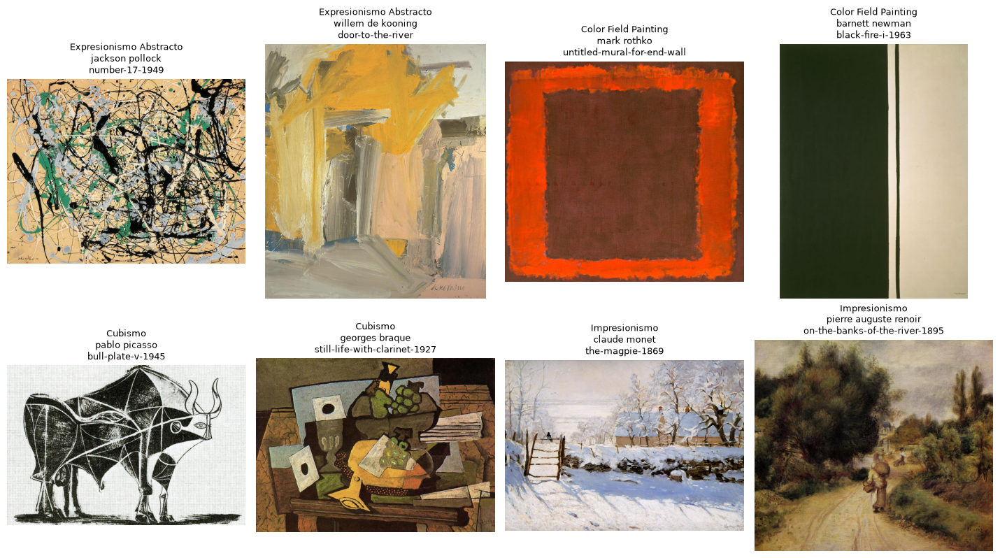

In [ ]:
# Galeria de las obras seleccionadas, agrupadas por genero.

def mostrar_galeria(obras, columnas=4, alto_fila=4.2):
    """Dibuja una grilla con las obras seleccionadas, rotuladas por genero y artista.

    Parametros
    ----------
    obras : pd.DataFrame
        Salida de seleccionar_obras.
    columnas : int
        Numero de columnas de la grilla.
    alto_fila : float
        Alto en pulgadas de cada fila de la figura.
    """

    filas = math.ceil(len(obras) / columnas)

    fig, axes = plt.subplots(
        filas,
        columnas,
        figsize=(columnas * 3.6, filas * alto_fila),
    )
    axes = np.atleast_1d(axes).ravel()

    for ax, (_, obra) in zip(axes, obras.iterrows()):
        ruta = obra["ruta_local"]

        if ruta is not None and os.path.isfile(ruta):
            with Image.open(ruta) as imagen:
                ax.imshow(imagen.convert("RGB"))
        else:
            ax.text(0.5, 0.5, "Imagen no disponible",
                    ha="center", va="center", fontsize=9, color="gray")

        ax.set_title(
            f"{obra['genero_es']}\n{obra['artista']}\n{obra['obra']}",
            fontsize=9,
        )

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


mostrar_galeria(obras.sort_values("genero").reset_index(drop=True), columnas=4)

### Resultado de la conformación del conjunto

Al mirar la galería se ve que el sorteo cumplió su objetivo: quedaron dos obras por género y las cuatro familias se distinguen a simple vista.

En expresionismo abstracto encontramos lo que esperábamos: figuras deformes y colores lanzados de manera caótica, buscando expresar sensaciones más que representar algo concreto. Son las obras con mayor variedad de tonos de todo el conjunto.

En color field pasa justo lo contrario. Son cuadros abstractos armados con grandes bloques cuadrados o rectangulares, de colores lisos, sólidos y muy saturados, casi sin mezclas ni transiciones.

El cubismo nos dio una sorpresa. Se ven los objetos y animales cotidianos descompuestos en figuras geométricas, como se esperaba, pero el Picasso que salió sorteado (bull plate V) es un grabado casi en blanco y negro: muchísimo contraste entre claros y oscuros, pero prácticamente nada de color. El Braque sí trae la gama de ocres y marrones que teníamos en mente.

El impresionismo es el que tiene los rasgos cromáticos más complejos, por esa tendencia a plasmar la luz y el instante con pinceladas sueltas. Eso sí, el Monet que salió (The Magpie) es una escena de nieve, así que su riqueza está más en las variaciones sutiles de luz que en los colores intensos.

Con todo esto ya podemos anticipar algo antes de correr los modelos: el número de grupos no debería ser igual para todos. Va a ser interesante ver si el comportamiendo de los algoritmos en las siguientes secciones.

<a id="seccion-2"></a>
# 2. Preparación de las imágenes

<a id="s2-1"></a>
## 2.1 Decisiones de preparación y su justificación

Una imagen no se puede entregar directamente a un algoritmo de agrupación: hay que convertirla en
una matriz de observaciones. Cada transformación aplicada en ese camino es una decisión que afecta
al resultado, de modo que se documentan todas junto con su motivo.

| # | Decisión | Justificación |
|---|---|---|
| 1 | **Convertir a RGB** | Las obras del dataset llegan en modos heterogéneos (`RGB`, `L` en escala de grises, `P` con paleta indexada, `RGBA` con transparencia). Forzar `RGB` garantiza que toda imagen produzca exactamente tres canales y que el canal alfa no se cuele como una cuarta variable sin sentido cromático. |
| 2 | **Redimensionar a un lado máximo de 400 px, preservando la relación de aspecto** | El objeto de estudio es la **distribución** de colores, que es esencialmente invariante a la resolución: reducir la imagen conserva las proporciones de cada familia cromática pero reduce el número de observaciones de ~1.5 M a ~150 k. Se preserva la relación de aspecto porque deformar la imagen alteraría el área relativa de cada región y, con ella, el peso de cada color en la paleta. |
| 3 | **No aplicar suavizado ni reducción de ruido** | Un filtro de mediana o gaussiano eliminaría la textura del pincel, pero al promediar píxeles vecinos **crearía colores intermedios que no existen en la obra**. Como el entregable es una paleta de colores reales, se prefiere conservar el grano original. |
| 4 | **Aplanar a una matriz `(n_píxeles, 3)`** | Se descarta deliberadamente la posición del píxel. La paleta es un problema de *color*, no de segmentación espacial: dos manchas del mismo tono en esquinas opuestas del lienzo deben caer en el mismo grupo. Incluir las coordenadas convertiría el problema en otro distinto. |
| 5 | **Muestrear al azar, sin reemplazo, hasta 20.000 píxeles** | El coeficiente de Silhouette requiere la matriz de distancias entre observaciones, de coste $O(n^2)$: con 150.000 píxeles son ~22.500 millones de pares, inviable. El muestreo aleatorio simple es un **estimador insesgado** de la distribución de colores, así que las proporciones de la paleta se conservan. La semilla fija lo hace reproducible. |
| 6 | **Convertir de RGB a CIELAB** | Es la decisión de mayor impacto y se detalla abajo. |

### Por qué CIELAB y no RGB

Los tres algoritmos que se emplean —K-Means, Mean Shift y GMM con covarianza esférica o diagonal—
construyen sus grupos a partir de la **distancia euclidiana**. Por tanto, la calidad del
agrupamiento depende por completo de que esa distancia signifique algo en el espacio elegido.

En RGB **no lo significa**. RGB describe cómo excita un color a los tres fósforos de una pantalla,
no cómo lo percibe el ojo. La consecuencia es que dos pares de colores separados por la misma
distancia euclidiana en RGB pueden verse, uno casi idéntico y el otro claramente distinto. El ojo
humano discrimina mucho mejor en la zona de los verdes que en la de los azules oscuros, y RGB no
recoge esa asimetría.

**CIELAB** fue diseñado justamente para corregirlo. Es un espacio *perceptualmente uniforme*: sus
tres ejes son la luminosidad $L^\ast \in [0, 100]$ y dos ejes cromáticos opuestos,
$a^\ast$ (verde–rojo) y $b^\ast$ (azul–amarillo), ambos aproximadamente en $[-128, 127]$. En él, la
distancia euclidiana entre dos colores

$$\Delta E_{76} = \sqrt{(\Delta L^\ast)^2 + (\Delta a^\ast)^2 + (\Delta b^\ast)^2}$$

aproxima la **diferencia de color percibida**, con una escala interpretable: $\Delta E \approx 1$ es
el umbral de diferencia apenas perceptible y $\Delta E < 2.3$ se considera indistinguible para un
observador no entrenado.

Agrupar en CIELAB es, entonces, lo que hace que la frase "estos píxeles pertenecen al mismo grupo"
signifique "estos píxeles se ven del mismo color". Además, esta métrica reaparece en §3.3 como
medida de la fidelidad de la paleta y en §4.2 como criterio para fusionar colores redundantes.

### Por qué *no* se estandarizan los canales L, a, b

Estandarizar (media 0, varianza 1) es un reflejo casi automático antes de aplicar K-Means, y aquí
**sería un error**. Escalar cada eje por su desviación típica dentro de la imagen destruiría
precisamente la propiedad por la que se eligió CIELAB: la distancia dejaría de ser $\Delta E$ y
pasaría a ser una métrica arbitraria, distinta para cada obra y por tanto no comparable entre
ellas.

Los tres canales, además, ya están en escalas del mismo orden de magnitud por construcción del
espacio, de modo que el argumento habitual para estandarizar —evitar que una variable de rango
grande domine a las demás— no aplica. La decisión es, pues, **omitir el escalado de forma
consciente**, no por descuido.

<a id="s2-2"></a>
## 2.2 Transformadores personalizados

Cada una de las transformaciones anteriores se implementa como una clase que hereda de
`BaseEstimator` y `TransformerMixin`, es decir, siguiendo la API de scikit-learn. Frente a
escribir una única función que lo haga todo, esto aporta:

- **Composición y reordenamiento.** Los pasos se combinan en un `Pipeline` y pueden reordenarse o
  sustituirse sin tocar el resto del código.
- **Parametrización unificada.** `pipeline.set_params(redimensionar__lado_maximo=600)` cambia la
  configuración desde fuera, lo que permite explorar variantes sin reescribir nada.
- **Reutilización parcial.** Un `Pipeline` admite *slicing*: `pipeline[:2]` es un sub-pipeline que
  se detiene tras redimensionar y devuelve la imagen preparada. Esto se aprovecha en §6 para
  obtener, del mismo objeto, tanto la matriz de píxeles para el modelo como la imagen para
  mostrar.

> **Detalle de implementación importante.** scikit-learn comprueba que un estimador esté "ajustado"
> buscando algún atributo cuyo nombre termine en guion bajo. Si `fit` se limita a `return self`,
> la llamada posterior a `pipeline.transform(...)` falla con `NotFittedError`. Por eso todos los
> transformadores heredan de `TransformadorBase`, cuyo `fit` deja marcado `self.ajustado_ = True`.

In [ ]:
# Transformadores de la etapa de preparacion, siguiendo la API de scikit-learn.

class TransformadorBase(BaseEstimator, TransformerMixin):
    """Base comun de los transformadores del pipeline.

    Ninguna de las transformaciones aprende parametros de los datos, asi que
    fit() no hace calculos. Deja, eso si, el atributo 'ajustado_': scikit-learn
    lo usa para considerar el estimador como ajustado y sin el fallaria
    transform() con NotFittedError.
    """

    def fit(self, X, y=None):
        self.ajustado_ = True
        return self


class CargarImagen(TransformadorBase):
    """Ruta de archivo -> ndarray (alto, ancho, 3) de tipo uint8 en RGB."""

    def transform(self, X):

        with Image.open(X) as imagen:
            imagen = imagen.convert("RGB")
            return np.asarray(imagen, dtype=np.uint8)



class RedimensionarLadoMaximo(TransformadorBase):
    """Reduce la imagen hasta que su lado mayor mida 'lado_maximo', sin deformarla."""

    def __init__(self, lado_maximo=LADO_MAXIMO):
        self.lado_maximo = lado_maximo

    def transform(self, X):

        alto, ancho = X.shape[:2]
        factor = min(self.lado_maximo / ancho, self.lado_maximo / alto, 1.0)

        if factor == 1.0:
            return X

        nuevo_ancho = max(1, round(ancho * factor))
        nuevo_alto = max(1, round(alto * factor))

        imagen = Image.fromarray(X).resize((nuevo_ancho, nuevo_alto), Image.LANCZOS)

        return np.asarray(imagen, dtype=np.uint8)


class AplanarPixeles(TransformadorBase):
    """(alto, ancho, 3) -> (alto * ancho, 3). Descarta la posicion del pixel."""

    def transform(self, X):
        return X.reshape(-1, 3)


class MuestrearPixeles(TransformadorBase):
    """Submuestreo aleatorio sin reemplazo hasta 'n_maximo' pixeles."""

    def __init__(self, n_maximo=N_MAXIMO, semilla=SEMILLA):
        self.n_maximo = n_maximo
        self.semilla = semilla

    def transform(self, X):

        if len(X) <= self.n_maximo:
            return X
        rng = np.random.default_rng(self.semilla)
        indices = rng.choice(len(X), size=self.n_maximo, replace=False)
        return X[indices]


class ConvertirEspacioColor(TransformadorBase):
    """Convierte una matriz de pixeles entre RGB (uint8) y CIELAB (float)."""

    def __init__(self, destino="lab"):
        self.destino = destino

    def transform(self, X):

        if self.destino == "lab":
            return rgb2lab(X)

        if self.destino == "rgb":
            rgb = lab2rgb(np.asarray(X, dtype=np.float64))
            return np.round(np.clip(rgb, 0, 1) * 255).astype(np.uint8)

        raise ValueError(
            f"destino no reconocido: {self.destino!r}. Use 'lab' o 'rgb'."
        )



<a id="s2-3"></a>
## 2.3 Construcción del pipeline

Los cinco transformadores se encadenan en un único objeto `Pipeline`. Su entrada es la **ruta** de
una imagen y su salida la matriz `(n_píxeles, 3)` en CIELAB lista para los algoritmos de la
sección 3.

El orden no es arbitrario. El muestreo va **después** de aplanar y **antes** de convertir a CIELAB
por una razón de coste: `rgb2lab` es una conversión no lineal relativamente cara, y aplicarla sobre
20.000 píxeles en vez de sobre 150.000 la abarata sin cambiar el resultado, ya que la conversión es
punto a punto e independiente entre píxeles.

In [ ]:
# Construccion del pipeline de preparacion.

def construir_pipeline(lado_maximo=LADO_MAXIMO, n_maximo=N_MAXIMO,
                       espacio="lab", semilla=SEMILLA):
    """Arma el pipeline que va de una ruta de imagen a una matriz de pixeles.

    Etapas: cargar -> redimensionar -> aplanar -> muestrear -> convertir espacio.

    Parametros
    ----------
    lado_maximo : int
        Lado mayor de la imagen despues de redimensionar.
    n_maximo : int
        Tope de pixeles muestreados por imagen.
    espacio : {"lab", "rgb"}
        Espacio de color de la salida.
    semilla : int
        Semilla del muestreo.

    Retorna
    -------
    sklearn.pipeline.Pipeline
        Pipeline sin ajustar. Usar .fit_transform(ruta) la primera vez.
    """

    return Pipeline([
        ("cargar", CargarImagen()),
        ("redimensionar", RedimensionarLadoMaximo(lado_maximo=lado_maximo)),
        ("aplanar", AplanarPixeles()),
        ("muestrear", MuestrearPixeles(n_maximo=n_maximo, semilla=semilla)),
        ("convertir", ConvertirEspacioColor(destino=espacio)),
    ])


pipeline = construir_pipeline()
pipeline

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('cargar', ...), ('redimensionar', ...), ...]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,lado_maximo,400
,n_maximo,20000
,semilla,42
,destino,'lab'


<a id="s2-4"></a>
## 2.4 Verificación del pipeline

Antes de seguir se comprueba que el pipeline procese correctamente las ocho obras. Para cada una se
registran las dimensiones originales y las resultantes, el número de píxeles antes y después del
muestreo, y los rangos observados en los tres canales.

Los rangos son la comprobación más informativa: si la conversión a CIELAB es correcta,
$L^\ast$ debe quedar dentro de $[0, 100]$ y $a^\ast, b^\ast$ dentro de $[-128, 127]$
aproximadamente. Valores fuera de esos límites indicarían que la normalización previa a `rgb2lab`
se omitió.

In [ ]:
# Comprobacion del pipeline sobre las ocho obras.

def verificar_pipeline(obras, pipeline):
    """Aplica el pipeline a cada obra y resume el resultado en una tabla.

    Aprovecha que un Pipeline admite slicing para recorrer la cadena por tramos
    y decodificar cada JPEG una sola vez:
        pipeline[:1]   -> imagen cargada, con sus dimensiones originales
        pipeline[1:2]  -> imagen redimensionada
        pipeline[2:]   -> aplanado, muestreo y conversion a CIELAB

    Retorna
    -------
    pd.DataFrame
        Una fila por obra con dimensiones originales y preparadas, numero de
        pixeles antes y despues del muestreo, rangos de L, a y b, y estado.
    """
    filas = []

    for _, obra in obras.iterrows():
        registro = {
            "genero_es": obra["genero_es"],
            "artista": obra["artista"],
            "obra": obra["obra"],
        }
        ruta = obra["ruta_local"]

        if ruta is None or not os.path.isfile(ruta):
            registro["estado"] = "Sin descargar"
            filas.append(registro)
            continue

        try:
            pipeline.fit(ruta)

            original = pipeline[:1].transform(ruta)
            preparada = pipeline[1:2].transform(original)
            X = pipeline[2:].transform(preparada)

            alto_o, ancho_o = original.shape[:2]
            alto_p, ancho_p = preparada.shape[:2]

            registro.update({
                "original": f"{ancho_o}x{alto_o}",
                "preparada": f"{ancho_p}x{alto_p}",
                "pixeles_totales": alto_p * ancho_p,
                "pixeles_muestra": len(X),
                "L_min": round(float(X[:, 0].min()), 1),
                "L_max": round(float(X[:, 0].max()), 1),
                "a_min": round(float(X[:, 1].min()), 1),
                "a_max": round(float(X[:, 1].max()), 1),
                "b_min": round(float(X[:, 2].min()), 1),
                "b_max": round(float(X[:, 2].max()), 1),
                "estado": "OK",
            })
        except Exception as error:
            registro["estado"] = f"{type(error).__name__}: {error}"

        filas.append(registro)

    return pd.DataFrame(filas)


resumen_preparacion = verificar_pipeline(obras, pipeline)
display(resumen_preparacion)


assert (resumen_preparacion["estado"] == "OK").all(), \
    "Alguna imagen no pudo procesarse"

# Rangos teoricos del espacio CIELAB.
assert resumen_preparacion["L_min"].min() >= 0, "L fuera de rango: hay valores negativos"
assert resumen_preparacion["L_max"].max() <= 100, "L fuera de rango: supera 100"
assert resumen_preparacion[["a_min", "b_min"]].min().min() >= -128, "a o b por debajo de -128"
assert resumen_preparacion[["a_max", "b_max"]].max().max() <= 128, "a o b por encima de 128"

# Estar DENTRO del rango no basta: unos valores minusculos tambien lo cumplirian.
# Toda obra real recorre buena parte del eje de luminosidad, asi que un L maximo
# bajo delata una conversion a CIELAB mal aplicada.
assert (resumen_preparacion["L_max"] > 50).all(), \
    "Valores de L implausibles: revisar la normalizacion en ConvertirEspacioColor"

print(f"\nPipeline verificado sobre {len(resumen_preparacion)} obras.")
print(f"Rango global de L: [{resumen_preparacion['L_min'].min()}, "
      f"{resumen_preparacion['L_max'].max()}]")


,genero_es,artista,obra,original,preparada,pixeles_totales,pixeles_muestra,L_min,L_max,a_min,a_max,b_min,b_max,estado
0,Impresionismo,claude monet,the-magpie-1869,1931x1382,400x286,114400,20000,0.0,96.7,-9.4,26.5,-33.3,38.6,OK
1,Impresionismo,pierre auguste renoir,on-the-banks-of-the-river-1895,1560x1382,400x354,141600,20000,0.3,80.0,-10.3,27.0,-12.6,48.3,OK
2,Cubismo,pablo picasso,bull-plate-v-1945,2062x1382,400x268,107200,20000,0.0,100.0,-11.1,4.6,-3.5,16.2,OK
3,Cubismo,georges braque,still-life-with-clarinet-1927,1893x1381,400x292,116800,20000,0.7,92.0,-21.6,43.6,-9.7,65.7,OK
4,Expresionismo Abstracto,jackson pollock,number-17-1949,1782x1382,400x310,124000,20000,0.0,99.7,-43.4,23.4,-13.2,47.2,OK
5,Expresionismo Abstracto,willem de kooning,door-to-the-river,1382x1597,346x400,138400,20000,23.4,95.2,-15.3,25.4,-38.3,73.0,OK
6,Color Field Painting,mark rothko,untitled-mural-for-end-wall,1497x1382,400x369,147600,20000,18.7,60.9,7.0,73.3,8.4,69.8,OK
7,Color Field Painting,barnett newman,black-fire-i-1963,1382x1874,295x400,118000,20000,13.9,98.2,-11.6,4.4,6.9,22.7,OK



Pipeline verificado sobre 8 obras.
Rango global de L: [0.0, 100.0]


<a id="s2-5"></a>
## 2.5 Extensión cromática por obra

La tabla de §2.4 contiene los mínimos y máximos de cada canal, pero leer 48 números sueltos no
permite comparar obras. Esta gráfica los traduce a **rangos**: una barra por obra que va de su
mínimo a su máximo, con la amplitud escrita al final.

No se usa un histograma porque no hay una distribución que resumir: son ocho observaciones por
canal, y un histograma de ocho valores produciría dos o tres barras sin información. Lo que
interesa aquí no es la frecuencia sino **la extensión y su posición**, que es justo lo que
representa un gráfico de rangos.

La posición importa tanto como la amplitud. En $L^\ast$ solo cuenta lo ancho del recorrido, pero en
$a^\ast$ y $b^\ast$ el cero es el gris neutro: una barra que no cruza el cero indica que la obra se
mantiene por completo en un lado del eje —solo tonos cálidos, o solo fríos—, mientras que una que lo
cruza abarca ambos. Por eso los dos paneles cromáticos comparten la misma escala $[-80, 80]$: si
cada uno se autoescalara, una obra apagada parecería tan amplia como una saturada.

Esta vista cierra la verificación del pipeline con una lectura que ya apunta a la sección 3: **una
gama amplia y repartida anticipa que harán falta más grupos; una gama estrecha, que bastarán pocos.**

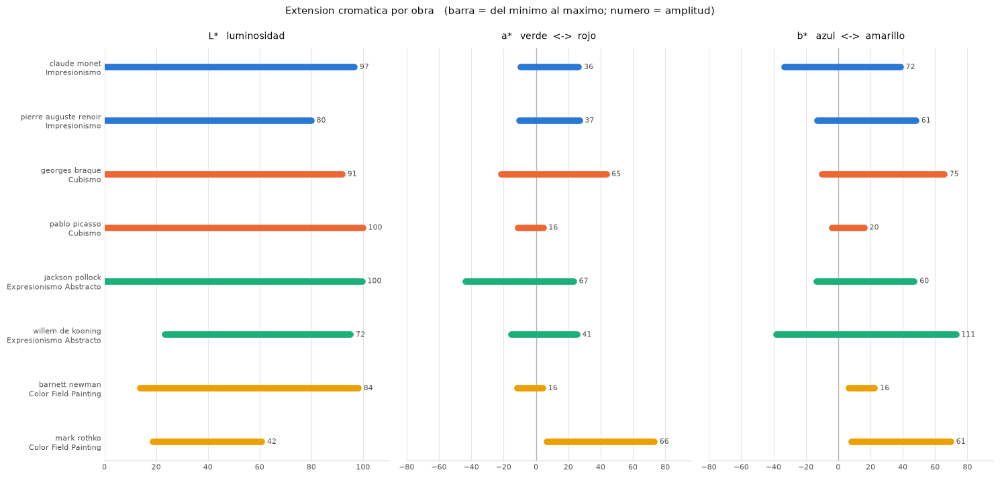

,genero_es,artista,obra,amplitud_L,amplitud_a,amplitud_b
0,Impresionismo,claude monet,the-magpie-1869,96.7,35.9,71.9
1,Impresionismo,pierre auguste renoir,on-the-banks-of-the-river-1895,79.7,37.3,60.9
2,Cubismo,georges braque,still-life-with-clarinet-1927,91.3,65.2,75.4
3,Cubismo,pablo picasso,bull-plate-v-1945,100.0,15.7,19.7
4,Expresionismo Abstracto,jackson pollock,number-17-1949,99.7,66.8,60.4
5,Expresionismo Abstracto,willem de kooning,door-to-the-river,71.8,40.7,111.3
6,Color Field Painting,barnett newman,black-fire-i-1963,84.3,16.0,15.8
7,Color Field Painting,mark rothko,untitled-mural-for-end-wall,42.2,66.3,61.4


In [128]:
# Extension cromatica de cada obra, a partir de la tabla de verificacion.

# Un color por genero. El orden de los slots esta fijado a proposito: son hues
# validados para ser distinguibles tambien con deficiencias de vision al color.
COLOR_GENERO = {
    "Impresionismo":           "#2a78d6",
    "Cubismo":                 "#eb6834",
    "Expresionismo Abstracto": "#1baf7a",
    "Color Field Painting":    "#eda100",
}

# (columna, titulo del panel, limites del eje)
CANALES_LAB = [
    ("L", "L*   luminosidad",          (0, 100)),
    ("a", "a*   verde  <->  rojo",     (-80, 80)),
    ("b", "b*   azul  <->  amarillo",  (-80, 80)),
]


def graficar_extension_cromatica(resumen, orden_generos=None):
    """Dibuja el rango de L*, a* y b* de cada obra y devuelve sus amplitudes.

    Cada obra es una barra que va de su minimo a su maximo en el canal. El
    numero al final es la amplitud (max - min). Los paneles de a* y b* comparten
    escala para que las gamas sean comparables entre obras.

    Parametros
    ----------
    resumen : pd.DataFrame
        Salida de verificar_pipeline, con las columnas L_min, L_max, a_min, ...
    orden_generos : list[str], opcional
        Orden en que se agrupan los generos. Por defecto, el de COLOR_GENERO.

    Retorna
    -------
    pd.DataFrame
        Las obras ordenadas por genero con tres columnas nuevas:
        amplitud_L, amplitud_a y amplitud_b.
    """
    datos = resumen[resumen["estado"] == "OK"].copy()

    for canal, _, _ in CANALES_LAB:
        datos[f"amplitud_{canal}"] = datos[f"{canal}_max"] - datos[f"{canal}_min"]

    # Se agrupa por genero para que las barras de un mismo genero queden juntas.
    orden = orden_generos or list(COLOR_GENERO)
    datos["_orden"] = pd.Categorical(datos["genero_es"], categories=orden, ordered=True)
    datos = datos.sort_values(["_orden", "artista"]).reset_index(drop=True)

    # El eje y se invierte para que la primera obra quede arriba.
    y = np.arange(len(datos))[::-1]

    fig, axes = plt.subplots(
        1, 3,
        figsize=(15, 0.62 * len(datos) + 2.2),
        sharey=True,
    )

    for ax, (canal, titulo, limites) in zip(axes, CANALES_LAB):
        # En a* y b* el cero es el gris neutro: marca la frontera entre
        # verde/rojo y entre azul/amarillo.
        if limites[0] < 0:
            ax.axvline(0, color="#b8b6ad", linewidth=1, zorder=1)

        for i, fila in datos.iterrows():
            color = COLOR_GENERO.get(fila["genero_es"], "#2a78d6")

            ax.plot(
                [fila[f"{canal}_min"], fila[f"{canal}_max"]], [y[i], y[i]],
                color=color, linewidth=7, solid_capstyle="round", zorder=3,
            )

            # La amplitud escrita al final de cada barra. Ademas de informar,
            # cumple el requisito de no depender solo del color para leerse.
            margen = (limites[1] - limites[0]) * 0.02
            ax.text(
                fila[f"{canal}_max"] + margen, y[i],
                f"{fila[f'amplitud_{canal}']:.0f}",
                va="center", ha="left", fontsize=8, color="#52514e", zorder=4,
            )

        ax.set_xlim(limites[0], limites[1] + (limites[1] - limites[0]) * 0.10)
        ax.set_title(titulo, fontsize=10, color="#0b0b0b", pad=10)
        ax.grid(axis="x", color="#e6e5df", linewidth=0.8, zorder=0)
        ax.set_axisbelow(True)

        for lado in ("top", "right", "left"):
            ax.spines[lado].set_visible(False)
        ax.spines["bottom"].set_color("#d5d3ca")
        ax.tick_params(colors="#52514e", labelsize=8, length=0)

    axes[0].set_yticks(y)
    axes[0].set_yticklabels(
        [f"{fila.artista}\n{fila.genero_es}" for fila in datos.itertuples()],
        fontsize=8, color="#52514e",
    )

    fig.suptitle(
        "Extension cromatica por obra   "
        "(barra = del minimo al maximo; numero = amplitud)",
        fontsize=11, color="#0b0b0b", y=0.99,
    )
    plt.tight_layout()
    plt.show()

    return datos.drop(columns="_orden")


extension_cromatica = graficar_extension_cromatica(resumen_preparacion)

display(
    extension_cromatica[
        ["genero_es", "artista", "obra", "amplitud_L", "amplitud_a", "amplitud_b"]
    ]
)


<a id="s2-6"></a>
## 2.6 Comprobación visual de la preparación

La tabla de §2.4 confirma que los números están dentro de rango, pero no dice si esos números
**corresponden a la obra**. Una imagen cargada con los canales permutados, por ejemplo, daría rangos
CIELAB perfectamente válidos y aun así estaría mal.

Mostrar la imagen preparada junto a la original aportaría poco: al redimensionar se conserva la
relación de aspecto, así que ambas se ven iguales y solo cambia la resolución, que la tabla ya
reporta. La comprobación útil es ver **lo que el pipeline realmente produce**, es decir, la matriz
CIELAB. Por eso cada obra se muestra en tres paneles:

| Panel | Qué muestra | Qué permite detectar |
|---|---|---|
| **Imagen preparada** | La salida de `pipeline[1:2]`, con sus dimensiones | Que la conversión a RGB y el redimensionado no deformaron ni alteraron la obra |
| **Canal $L^\ast$** | La luminosidad en escala de grises, con la escala fijada en $[0, 100]$ | Que la luminosidad se distribuye como en la obra. Si saliera casi negro, la normalización estaría mal aplicada |
| **Plano $a^\ast b^\ast$** | Los píxeles muestreados, cada uno pintado con su color real | La **gama cromática** de la obra: su extensión y hacia qué cuadrantes se inclina |

El tercer panel es el más informativo, y funciona como la versión visual del `assert` de §2.4: si la
conversión a CIELAB se rompiera, la nube colapsaría en un punto sobre el origen en lugar de
extenderse. Además anticipa la sección 5, donde esa misma nube se proyecta con t-SNE.

Leer los tres juntos permite anticipar la dificultad del agrupamiento: una nube compacta y con dos o
tres brazos bien definidos sugiere pocos grupos claros, mientras que una nube difusa y extendida
anuncia que la partición será más ambigua.

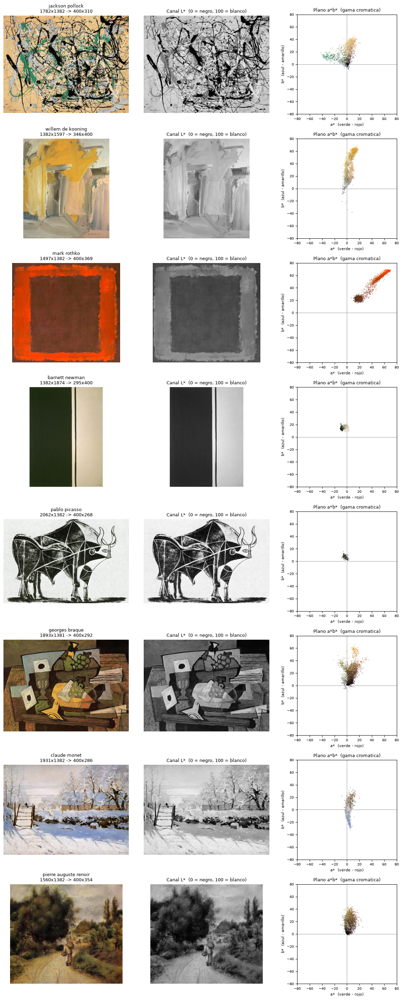

In [ ]:
# Comprobacion visual de lo que produce el pipeline.

def mostrar_preparacion(obras, pipeline, n_puntos=3000, alto_fila=3.6,
                        limite_ab=80, semilla=SEMILLA):
    """Panel de control visual del pipeline, con tres vistas por obra.

    Por cada obra dibuja: imagen preparada | canal L* | nube de pixeles en el
    plano a*-b* pintada con el color real de cada pixel.

    Parametros
    ----------
    obras : pd.DataFrame
        Salida de seleccionar_obras, con la columna 'ruta_local'.
    pipeline : sklearn.pipeline.Pipeline
        Pipeline de preparacion ya construido.
    n_puntos : int
        Pixeles a dibujar en el diagrama de dispersion. Con 20.000 el grafico
        se satura y pesa mucho; unos pocos miles bastan para ver la forma.
    alto_fila : float
        Alto en pulgadas de la fila de cada obra.
    limite_ab : float
        Semirrango de los ejes a* y b*. Se fija igual para todas las obras
        para que las gamas sean comparables entre si.
    semilla : int
        Semilla del submuestreo, para que la figura sea reproducible.
    """
    fig, axes = plt.subplots(
        len(obras), 3,
        figsize=(12, alto_fila * len(obras)),
    )

    axes = np.atleast_2d(axes)

    a_rgb = ConvertirEspacioColor(destino="rgb")
    rng = np.random.default_rng(semilla)

    for fila, (_, obra) in enumerate(obras.iterrows()):
        ax_img, ax_lum, ax_gama = axes[fila]
        ruta = obra["ruta_local"]

        if ruta is None or not os.path.isfile(ruta):
            for ax in (ax_img, ax_lum, ax_gama):
                ax.text(0.5, 0.5, "Imagen no disponible",
                        ha="center", va="center", fontsize=9, color="gray")
                ax.axis("off")
            continue

        # Se recorre el pipeline por tramos, igual que en verificar_pipeline,
        # para decodificar el archivo una sola vez.
        pipeline.fit(ruta)
        original = pipeline[:1].transform(ruta)
        preparada = pipeline[1:2].transform(original)
        X = pipeline[2:].transform(preparada)

        alto_o, ancho_o = original.shape[:2]
        alto_p, ancho_p = preparada.shape[:2]

        # --- Panel 1: la imagen que entra realmente al modelo ---
        ax_img.imshow(preparada)
        ax_img.set_title(
            f"{obra['artista']}\n{ancho_o}x{alto_o} -> {ancho_p}x{alto_p}",
            fontsize=9,
        )
        ax_img.axis("off")

        # --- Panel 2: canal de luminosidad ---
        # Se convierte la imagen COMPLETA, no la muestra, porque aqui interesa
        # conservar la disposicion espacial de los pixeles.
        lab_imagen = rgb2lab(preparada)

        # vmin y vmax fijos son imprescindibles: sin ellos matplotlib reescala
        # cada imagen a su propio rango y una conversion mal normalizada se
        # veria perfectamente normal.
        ax_lum.imshow(lab_imagen[:, :, 0], cmap="gray", vmin=0, vmax=100)
        ax_lum.set_title("Canal L*  (0 = negro, 100 = blanco)", fontsize=9)
        ax_lum.axis("off")

        # --- Panel 3: gama cromatica en el plano a*-b* ---
        indices = rng.choice(len(X), size=min(n_puntos, len(X)), replace=False)
        muestra = X[indices]

        # Cada punto se pinta con su color real, reutilizando el transformador
        # que ya existe en lugar de llamar a lab2rgb por separado.
        colores = a_rgb.transform(muestra) / 255.0

        ax_gama.scatter(
            muestra[:, 1], muestra[:, 2],
            c=colores, s=3, alpha=0.5, linewidths=0,
        )

        # Los ejes en cero separan los cuadrantes: a* < 0 verde, a* > 0 rojo;
        # b* < 0 azul, b* > 0 amarillo.
        ax_gama.axhline(0, color="gray", linewidth=0.6, zorder=0)
        ax_gama.axvline(0, color="gray", linewidth=0.6, zorder=0)

        ax_gama.set_xlim(-limite_ab, limite_ab)
        ax_gama.set_ylim(-limite_ab, limite_ab)
        ax_gama.set_aspect("equal")
        ax_gama.set_xlabel("a*  (verde - rojo)", fontsize=8)
        ax_gama.set_ylabel("b*  (azul - amarillo)", fontsize=8)
        ax_gama.tick_params(labelsize=7)
        ax_gama.set_title("Plano a*b*  (gama cromatica)", fontsize=9)

    plt.tight_layout()
    plt.show()


mostrar_preparacion(obras.sort_values("genero").reset_index(drop=True), pipeline)


### Resultado de la preparación

Las ocho obras completaron el pipeline sin errores. El redimensionamiento
llevó el lado mayor de todas ellas a 400 píxeles conservando la relación de
aspecto original y la comparación visual anterior confirma que no hay
distorsión apreciable.

Los rangos por canal revelan tres perfiles cromáticos distintos. Picasso
(`bull-plate-v`) y Newman (`black-fire-i`) ocupan cajas cromáticas de unas 300
unidades cuadradas en el plano a*-b*, un orden de magnitud por debajo del
resto: son obras casi acromáticas, cuya variación reside casi por completo en
la luminosidad. Rothko presenta el caso opuesto y más restrictivo: sus mínimos
en ambos canales son positivos (a*≥7.0, b*≥8.4), de modo que la obra completa
se confina al cuadrante rojo-amarillo sin un solo píxel frío, y a la vez es la
de menor amplitud en L* (18.7 a 60.9). Las restantes —Monet, Renoir, Braque,
Pollock y de Kooning— cruzan el origen y combinan tonos cálidos y fríos.

Estas gráficas informan la etapa de agrupamiento en dos sentidos. Indican la
dirección y la distancia de la paleta respecto al gris neutro, lo que
caracteriza la intensidad cromática de cada pintor, y anticipan qué obras
presentarán una estructura de grupos bien definida.

<a id="seccion-3"></a>
# 3. Modelo de agrupación con selección automática

Cada píxel es una observación $x_i = (L^\ast_i, a^\ast_i, b^\ast_i)$ en el espacio CIELAB. Agrupar
esos puntos equivale a encontrar las familias cromáticas de la obra.

Esta sección construye el componente central del método: un procedimiento que, dada **una imagen
cualquiera**, decide por sí mismo qué algoritmo usar y en cuántos grupos dividir sus colores.

<a id="s3-1"></a>
## 3.1 Selección de los algoritmos candidatos

Se comparan tres algoritmos que abordan el problema desde perspectivas distintas. Compararlos en
lugar de asumir uno permite que la elección quede sustentada en evidencia y no en preferencia.

| Algoritmo | Por qué es candidato | Hiperparámetro explorado |
|---|---|---|
| **K-Means** | Minimiza la suma de distancias cuadráticas al centroide, que en CIELAB **es exactamente el error de cuantización de color** de la paleta. Su función objetivo coincide con lo que se quiere optimizar. Además sus centroides *son* colores directamente utilizables, y escala bien a decenas de miles de puntos. | `n_clusters` $\in [2, 12]$ |
| **Gaussian Mixture Model** | Asignación blanda y covarianza libre: modela grupos **elipsoidales y anisótropos**, que es la forma real que toma un degradado en el espacio de color. Donde K-Means impone grupos esféricos del mismo tamaño, GMM puede describir una franja alargada de cielo o una transición continua de carne. | `n_components` $\in [2, 12]$ |
| **Mean Shift** | **No requiere fijar el número de grupos**: busca los máximos locales de densidad y deja que los datos determinen cuántos hay. Conceptualmente es la traducción literal de "color dominante", entendido como una acumulación de píxeles alrededor de un tono. | `quantile` $\in [0.05, 0.30]$, que fija el `bandwidth` |

### Algoritmos considerados y descartados

- **DBSCAN / HDBSCAN.** Aunque son excelentes para densidad arbitraria, etiquetan parte de las
  observaciones como ruido (`-1`). Ese ruido no tiene traducción a una paleta: un píxel de la obra
  no puede "no tener color". Además no producen un representante por grupo, que es justamente lo
  que se necesita para construir el muestrario.
- **Agrupamiento jerárquico aglomerativo.** Requiere la matriz de distancias completa, de coste
  $O(n^2)$ en memoria. Con 20.000 píxeles serían unos $2\times 10^8$ pares por imagen y por
  configuración, inviable dentro de una búsqueda de hiperparámetros.

<a id="s3-2"></a>
## 3.2 Métricas de validación

Al tratarse de aprendizaje no supervisado no existen etiquetas de referencia, así que la
evaluación debe apoyarse en **métricas internas**, que juzgan la partición a partir de los propios
datos. Se emplean tres, porque cada una mide un aspecto distinto y su consenso es más robusto que
cualquiera por separado:

| Métrica | Qué mide | Dirección |
|---|---|---|
| **Silhouette** | Para cada punto, cuánto más cerca está de su propio grupo que del grupo vecino más próximo. Recorre $[-1, 1]$. | Mayor es mejor |
| **Davies-Bouldin** | Razón media entre la dispersión interna de los grupos y la separación entre sus centros. | **Menor** es mejor |
| **Calinski-Harabasz** | Razón entre la varianza inter-grupo y la intra-grupo, escalada por los grados de libertad. | Mayor es mejor |

Silhouette se calcula sobre una submuestra de 5.000 píxeles porque necesita distancias por pares,
de coste $O(n^2)$; las otras dos se calculan sobre la muestra completa.

### Un sesgo que hay que documentar, no ignorar

**Silhouette premia sistemáticamente $k = 2$ en datos de color.** Casi cualquier imagen admite una
partición clara entre zonas claras y zonas oscuras, y esa bipartición produce grupos muy compactos
y muy separados a lo largo del eje $L^\ast$. El resultado es un Silhouette alto para $k=2$ que casi
nunca se supera al aumentar $k$.

Si la selección se hiciera maximizando Silhouette, el método devolvería paletas de dos colores para
todas las obras: técnicamente óptimas y cromáticamente inútiles. Sería, además, exactamente lo que
la definición del proyecto pide evitar, ya que el número de grupos dejaría de adaptarse a la imagen.

Este sesgo es la razón de ser del criterio que se define a continuación.

<a id="s3-3"></a>
## 3.3 Criterio automático de decisión

Esta es la pieza que hace que el método sea un método y no una serie de ajustes manuales. La regla
se define **antes** de observar ningún resultado, y se aplica sin excepciones a todas las imágenes,
incluidas las que el método no ha visto nunca (§6.4).

La decisión combina dos componentes que tiran en direcciones opuestas, lo cual es deliberado:

### Componente 1 — Validez interna del agrupamiento

Para cada configuración se normalizan las tres métricas al rango $[0, 1]$ **dentro de la misma
imagen** (min-max), invirtiendo Davies-Bouldin para que en las tres "mayor sea mejor". Su promedio
da un único número:

$$\text{score\_validez} = \frac{1}{3}\left( \widetilde{\text{Sil}} + (1 - \widetilde{\text{DB}}) + \widetilde{\text{CH}} \right) \in [0, 1]$$

La normalización es *por imagen* a propósito: las métricas internas no son comparables entre
conjuntos de datos distintos, solo entre particiones del mismo conjunto.

Por el sesgo descrito en §3.2, este componente favorece pocos grupos.

### Componente 2 — Fidelidad cromática

Se mide el error real que comete la paleta al representar la obra: la distancia media, en CIELAB,
entre cada píxel y el color que lo representa.

$$\Delta E_{\text{medio}}(k) = \frac{1}{n}\sum_{i=1}^{n} \lVert x_i - c_{\ell(i)} \rVert_2$$

Su ventaja es que **tiene unidades interpretables**: es la diferencia de color percibida promedio
entre la obra y su versión reducida a la paleta. $\Delta E \approx 1$ es el umbral clásico de
diferencia apenas perceptible.

$\Delta E_{\text{medio}}$ decrece de forma monótona al aumentar $k$ —con más colores siempre se
aproxima mejor—, así que su mínimo no sirve como criterio: llevaría al $k$ máximo. Lo informativo es
**cuánto compra cada color adicional**:

$$\text{mejora}(k) = \Delta E_{\text{medio}}(k) - \Delta E_{\text{medio}}(k+1)$$

Se toma como piso el primer $k$ cuya mejora cae por debajo de **una unidad $\Delta E$**. La lectura
es directa: *añadir un color más ya no produce una diferencia que el ojo pueda apreciar.*

> **Por qué una pendiente absoluta y no el codo de la curva.** La primera versión de este criterio
> localizaba el codo por máxima distancia a la cuerda (el método *kneedle*, implementado en
> `detectar_codo`). Se descartó al comprobar que **la curva de $\Delta E$ tiene una forma muy
> parecida en casi cualquier imagen**: el codo relativo caía siempre en la misma zona y no
> distinguía una obra de dos campos planos de un dripping. Una pendiente en unidades absolutas sí
> los distingue, precisamente porque $\Delta E$ tiene significado perceptual y su escala varía mucho
> entre obras. `detectar_codo` se conserva y se dibuja en las gráficas de §3.5 como referencia, para
> dejar constancia de la comparación.

**La curva se construye solo con las configuraciones de K-Means**, por dos razones: su función
objetivo *es* el error de cuantización que mide $\Delta E$, y recorre una rejilla regular de $k$.
Mean Shift no recibe $k$ sino que lo produce, y llega a devolver valores muy fuera de la rejilla
—$k = 22$, $37$, $74$ en algunas obras— con un $\Delta E$ que además **no decrece de forma
monótona**, porque optimiza modos de densidad y no error de cuantización. Mezclarlo deformaría la
curva. Mean Shift sigue compitiendo con normalidad en el paso siguiente.

Este componente favorece muchos grupos.

### La regla

> Se calcula el piso $k^\ast$ como el primer $k$ donde un color adicional deja de aportar una unidad
> $\Delta E$ de mejora. Entre todas las configuraciones con $k \geq k^\ast$ —las que ya alcanzaron
> una fidelidad cromática suficiente— se elige la de **mayor `score_validez`**.

El piso descarta las particiones que simplifican en exceso la obra, lo que neutraliza el sesgo de
Silhouette hacia $k=2$. La validez interna actúa como **techo**: entre las opciones suficientemente
fieles, prefiere la mejor estructurada, lo que evita fragmentar la paleta en decenas de tonos casi
idénticos.

Como la regla se aplica a las configuraciones de los tres algoritmos a la vez, **la elección del
algoritmo es también automática**: gana el que produzca la partición mejor valorada para esa imagen
concreta.


In [ ]:
# Rejilla de configuraciones a explorar. Es identica para todas las imagenes:
# lo que cambia entre obras es cual gana, no que se prueba.

RANGO_K = range(2, 13)                                  # K-Means y GMM
CUANTILES_MEANSHIFT = (0.05, 0.10, 0.15, 0.20, 0.25, 0.30)
TIPO_COVARIANZA_GMM = "full"                            # covarianza libre por componente


def ajustar_modelo(X, algoritmo, parametros, semilla=SEMILLA):
    """Ajusta uno de los tres algoritmos y devuelve una salida homogenea.

    Unifica las tres APIs para que el resto del notebook no tenga que
    distinguir entre ellas.

    Parametros
    ----------
    X : ndarray (n, 3)
        Pixeles en CIELAB.
    algoritmo : {"K-Means", "GMM", "Mean Shift"}
    parametros : dict
        {"k": int} para K-Means y GMM, {"quantile": float} para Mean Shift.

    Retorna
    -------
    etiquetas : ndarray (n,)
    centros   : ndarray (k, 3)   centro en CIELAB de cada grupo
    modelo    : el estimador ya ajustado
    """

    if algoritmo == "K-Means":
        modelo = KMeans(n_clusters=int(parametros["k"]), random_state=semilla, n_init=10)
        etiquetas = modelo.fit_predict(X)
        centros = modelo.cluster_centers_

    elif algoritmo == "GMM":
        modelo = GaussianMixture(
            n_components=int(parametros["k"]),
            covariance_type=TIPO_COVARIANZA_GMM,
            random_state=semilla,
        )
        etiquetas = modelo.fit_predict(X)
        centros = modelo.means_

    elif algoritmo == "Mean Shift":
        bandwidth = estimate_bandwidth(
            X, quantile=parametros["quantile"], n_samples=3000, random_state=semilla
        )

        if bandwidth <= 0:
            return None

        modelo = MeanShift(bandwidth=bandwidth, bin_seeding=True)
        etiquetas = modelo.fit_predict(X)
        centros = modelo.cluster_centers_

    else:
        raise ValueError(f"algoritmo no reconocido: {algoritmo!r}. "
                        "Use 'K-Means', 'GMM' o 'Mean Shift'.")

    return etiquetas, centros, modelo


def calcular_metricas(X, etiquetas, centros, n_silueta=N_SILUETA, semilla=SEMILLA):
    """Calcula las cinco medidas con que se juzga una particion.

    Retorna
    -------
    dict con las claves 'silhouette', 'davies_bouldin', 'calinski_harabasz',
    'delta_e_medio' y 'delta_e_p95'. Las dos ultimas miden el error de la
    paleta en unidades DeltaE76: la media resume la fidelidad global y el
    percentil 95 revela cuanto se equivoca en los pixeles peor representados,
    que la media puede esconder.

    Devuelve None si la particion tiene menos de 2 grupos, caso en que las
    metricas internas no estan definidas.
    """

    k = len(np.unique(etiquetas))
    if k < 2:
        return None

    if len(X) > n_silueta:
        rng = np.random.default_rng(semilla)
        idx = rng.choice(len(X), size=n_silueta, replace=False)
        X_sub = X[idx]
        etiquetas_sub = etiquetas[idx]

    else:
        X_sub = X
        etiquetas_sub = etiquetas

    try:
        silueta = silhouette_score(X_sub, etiquetas_sub)
    except ValueError:
        silueta = np.nan

    delta_e_medio = np.linalg.norm(X - centros[etiquetas], axis=1)

    return {
        "silhouette": silueta,
        "davies_bouldin": davies_bouldin_score(X, etiquetas),
        "calinski_harabasz": calinski_harabasz_score(X, etiquetas),
        "delta_e_medio": delta_e_medio.mean(),
        "delta_e_p95": np.percentile(delta_e_medio, 95),
    }

In [ ]:
# Busqueda de hiperparametros y regla automatica de seleccion.

def buscar_hiperparametros(X, semilla=SEMILLA, verbose=False):
    """Recorre la rejilla completa de configuraciones para UNA imagen.

    Retorna
    -------
    pd.DataFrame
        Una fila por configuracion valida, con columnas: algoritmo, parametro,
        valor, k, silhouette, davies_bouldin, calinski_harabasz,
        delta_e_medio y segundos.
    """

    configuraciones = [
        ("K-Means", {"k": k}) for k in RANGO_K
    ] + [
        ("GMM", {"k": k}) for k in RANGO_K
    ] + [
        ("Mean Shift", {"quantile": q}) for q in CUANTILES_MEANSHIFT
    ]

    filas = []

    for algoritmo, parametros in configuraciones:
        inicio = time.perf_counter()
        resultados = ajustar_modelo(X, algoritmo, parametros, semilla=semilla)
        segundos = time.perf_counter() - inicio

        if resultados is None:
            if verbose:
                print(f"{algoritmo} {parametros} -> Configuracion invalida")
            continue

        etiquetas, centros, modelo = resultados
        metricas = calcular_metricas(X, etiquetas, centros, semilla=semilla)

        if metricas is None:
            if verbose:
                print(f"{algoritmo} {parametros} -> Menos de dos grupos")
            continue

        filas.append({
            "algoritmo": algoritmo,
            "parametro": next(iter(parametros)),
            "valor": next(iter(parametros.values())),
            "k": len(np.unique(etiquetas)),
            **metricas,
            "segundos": segundos
        })

        if verbose:
            print(f"{algoritmo} {parametros} -> k={len(np.unique(etiquetas))}, "
                f"silhouette={metricas['silhouette']:.3f}, "
                f"davies_bouldin={metricas['davies_bouldin']:.3f}, "
                f"calinski_harabasz={metricas['calinski_harabasz']:.3f}, "
                f"delta_e_medio={metricas['delta_e_medio']:.3f}, "
                f"segundos={segundos:.2f}")

    return pd.DataFrame(filas)



def calcular_score_validez(tabla):
    """Normaliza las tres metricas internas dentro de la imagen y las promedia.

    Anade la columna 'score_validez' en [0, 1], donde 1 es la mejor particion
    segun el consenso de las tres medidas.

    La normalizacion se hace sobre la tabla COMPLETA, no por algoritmo. Es
    deliberado: si cada algoritmo se normalizara por separado, los tres
    tendrian su propio maximo igual a 1 y dejarian de ser comparables entre si,
    con lo que la eleccion automatica del algoritmo perderia sentido.
    """

    def minmax(serie):
        """Lleva una serie a [0, 1]. Devuelve 0.5 constante si no hay rango."""
        rango = serie.max() - serie.min()
        if not np.isfinite(rango) or rango == 0:
            return pd.Series(0.5, index=serie.index)
        return (serie - serie.min()) / rango

    tabla = tabla.copy()

    sil_n = minmax(tabla["silhouette"])
    ch_n = minmax(tabla["calinski_harabasz"])
    db_n = 1 - minmax(tabla["davies_bouldin"])   # menor es mejor: se invierte

    tabla["score_validez"] = (sil_n + ch_n + db_n) / 3

    return tabla


def detectar_codo(x, y):
    """Localiza el codo de una curva monotona por el metodo de la cuerda.

    Normaliza ambos ejes a [0, 1], traza la cuerda entre el primer y el ultimo
    punto y devuelve el valor de x cuyo punto queda mas lejos de esa recta.

    Parametros
    ----------
    x : array-like  valores del eje horizontal, ordenados de menor a mayor
    y : array-like  valores del eje vertical

    Retorna
    -------
    El elemento de x correspondiente al codo.
    """

    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)

    orden = np.argsort(x)
    x = x[orden]
    y = y[orden]

    if len(x) < 3:
        return x[0]

    rango_x = x.max() - x.min()
    rango_y = y.max() - y.min()

    xn = (x - x.min()) / rango_x if rango_x > 0 else np.zeros_like(x)
    yn = (y - y.min()) / rango_y if rango_y > 0 else np.zeros_like(y)

    dx = xn[-1] - xn[0]
    dy = yn[-1] - yn[0]

    distancias = np.abs(dx * (yn[0] - yn) - (xn[0] - xn) * dy)

    return x[np.argmax(distancias)]


# Mejora minima, en unidades DeltaE76, que debe aportar un color adicional
# para que valga la pena incluirlo. DeltaE = 1 es el umbral clasico de
# diferencia apenas perceptible: por debajo de eso, el color extra no compra
# una mejora que el ojo pueda apreciar.
MEJORA_MINIMA_DELTA_E = 1.0


def k_minimo_por_fidelidad(curva, mejora_minima=MEJORA_MINIMA_DELTA_E):
    """Primer k a partir del cual anadir un grupo ya no mejora apreciablemente.

    Recorre la curva delta_e_medio(k) y se detiene en el primer punto cuya
    mejora al pasar al siguiente k es menor que 'mejora_minima'.

    Se usa una pendiente en unidades absolutas y no el codo de la cuerda
    (detectar_codo) porque la curva de DeltaE tiene una forma parecida en casi
    cualquier imagen: el codo relativo cae siempre en la misma zona y no
    distingue una obra de dos campos planos de un dripping. La pendiente
    absoluta si lo hace, porque DeltaE tiene unidades perceptuales.

    Parametros
    ----------
    curva : pd.DataFrame
        Con columnas 'k' y 'delta_e_medio', ordenado por k ascendente.
    mejora_minima : float
        Reduccion minima de DeltaE que justifica un grupo adicional.

    Retorna
    -------
    int
        El k propuesto como piso. Si ninguna mejora baja del umbral, devuelve
        el mayor k disponible.
    """
    k = curva["k"].to_numpy()
    delta_e = curva["delta_e_medio"].to_numpy()

    if len(k) < 2:
        return int(k[0])

    mejoras = delta_e[:-1] - delta_e[1:]

    for i, mejora in enumerate(mejoras):
        if mejora < mejora_minima:
            return int(k[i])

    return int(k[-1])


def seleccionar_configuracion(tabla, mejora_minima=MEJORA_MINIMA_DELTA_E):
    """Aplica la regla de la seccion 3.3 y devuelve la configuracion ganadora.

    Piso  : k_minimo_por_fidelidad marca a partir de que k un color adicional
            deja de aportar una mejora perceptible. Descarta las particiones
            que simplifican en exceso la obra.
    Techo : entre las que superan ese piso, gana la de mayor score_validez.

    La curva de fidelidad se construye SOLO con las filas de K-Means. Hay dos
    razones: su funcion objetivo es exactamente el error de cuantizacion que
    mide DeltaE, y recorre una rejilla regular de k. Mean Shift, en cambio, no
    recibe k sino que lo produce, y llega a devolver valores muy fuera de la
    rejilla (k = 22, 37, 74 en algunas obras) con un DeltaE que no decrece de
    forma monotona. Mezclarlo en la curva la deforma y hace que el piso pierda
    sentido. Mean Shift sigue compitiendo con normalidad en el paso del techo.

    Retorna
    -------
    dict
        La fila ganadora mas 'k_piso' (el piso aplicado) y 'k_codo' (el codo
        de la cuerda, que se conserva solo como referencia en las graficas
        diagnosticas de la seccion 3.5).
    """
    tabla = calcular_score_validez(tabla)

    # Curva de fidelidad: el mejor DeltaE alcanzable con cada k.
    base = tabla[tabla["algoritmo"] == "K-Means"]
    if base.empty:
        base = tabla

    curva = (
        base.groupby("k", as_index=False)["delta_e_medio"]
        .min()
        .sort_values("k")
    )

    k_piso = k_minimo_por_fidelidad(curva, mejora_minima=mejora_minima)

    candidatas = tabla[tabla["k"] >= k_piso]
    if candidatas.empty:
        candidatas = tabla

    ganadora = candidatas.loc[candidatas["score_validez"].idxmax()].to_dict()
    ganadora["k_piso"] = k_piso
    ganadora["k_codo"] = int(detectar_codo(curva["k"], curva["delta_e_medio"]))

    return ganadora


<a id="s3-4"></a>
## 3.4 Búsqueda sobre el conjunto de obras

La búsqueda se ejecuta de forma independiente para cada obra. Es el paso más costoso del notebook:
28 configuraciones por imagen (11 de K-Means, 11 de GMM y 6 de Mean Shift), cada una con el cálculo
de sus cuatro medidas.

Mean Shift domina el tiempo total porque su coste es cuadrático en el número de puntos. Se mitiga
con `bin_seeding=True`, que inicializa las semillas sobre una rejilla discretizada en lugar de
sobre cada observación, y estimando el `bandwidth` sobre una submuestra de 3.000 píxeles.

In [ ]:
# Busqueda de hiperparametros para las ocho obras. Es la celda mas lenta del notebook.

resultados_busqueda = {}   # clave -> DataFrame de configuraciones
muestras_lab = {}          # clave -> matriz (n, 3) en CIELAB, reutilizada mas adelante

inicio_total = time.perf_counter()

for i, fila in obras.iterrows():
    clave = f"{fila['artista']} | {fila['obra']}"
    print(f"[{i + 1}/{len(obras)}] {clave}", end="  ")

    X = pipeline.fit_transform(fila["ruta_local"])
    muestras_lab[clave] = X
    resultados_busqueda[clave] = buscar_hiperparametros(X, semilla=SEMILLA)

    segundos = time.perf_counter() - inicio_total
    print(f"{len(resultados_busqueda[clave])} configuraciones validas, "
        f"{segundos:.1f} s")

print(f"\nTiempo total de la busqueda: {time.perf_counter() - inicio_total:.1f} s")

[1/8] claude monet | the-magpie-1869  28 configuraciones validas, 10.5 s
[2/8] pierre auguste renoir | on-the-banks-of-the-river-1895  28 configuraciones validas, 24.7 s
[3/8] pablo picasso | bull-plate-v-1945  28 configuraciones validas, 35.8 s
[4/8] georges braque | still-life-with-clarinet-1927  28 configuraciones validas, 44.8 s
[5/8] jackson pollock | number-17-1949  28 configuraciones validas, 53.8 s
[6/8] willem de kooning | door-to-the-river  28 configuraciones validas, 63.0 s
[7/8] mark rothko | untitled-mural-for-end-wall  28 configuraciones validas, 73.5 s
[8/8] barnett newman | black-fire-i-1963  28 configuraciones validas, 82.6 s

Tiempo total de la busqueda: 82.6 s


<a id="s3-5"></a>
## 3.5 Curvas diagnósticas

Estas gráficas **no deciden nada**: la decisión ya la tomó la regla de §3.3. Sirven para verificar
que la regla se comporta como se esperaba y para dejar evidencia del razonamiento.

Se dibujan tres paneles por obra:

1. **Silhouette frente a $k$**, donde debería verse el sesgo hacia $k=2$ descrito en §3.2.
2. **$\Delta E_{\text{medio}}$ frente a $k$**, con el codo marcado. Es la curva que fija el piso.
3. **Número de grupos frente a `quantile` en Mean Shift**, que muestra cuántos modos de densidad
   detecta el algoritmo según la amplitud de la ventana.

Configuraciones seleccionadas: 8 de 8


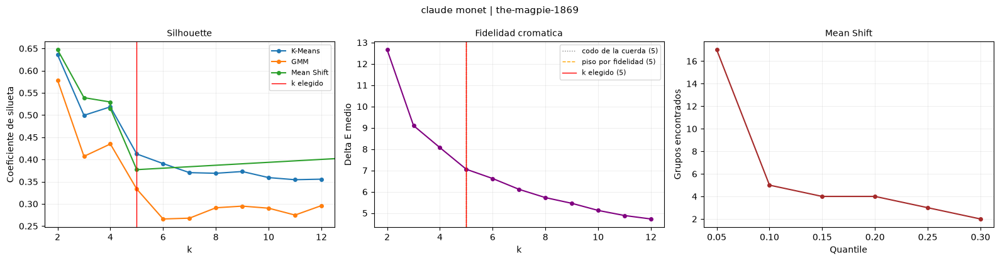

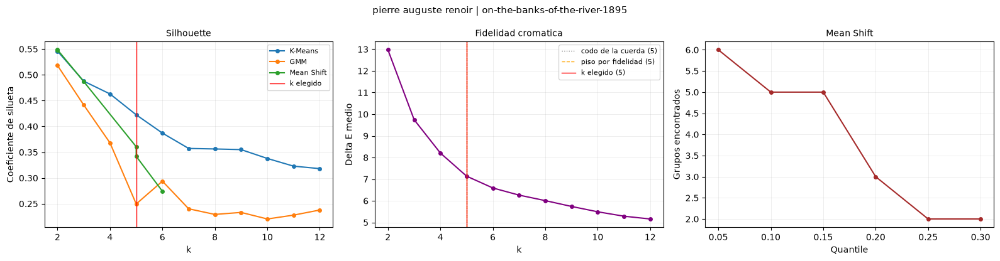

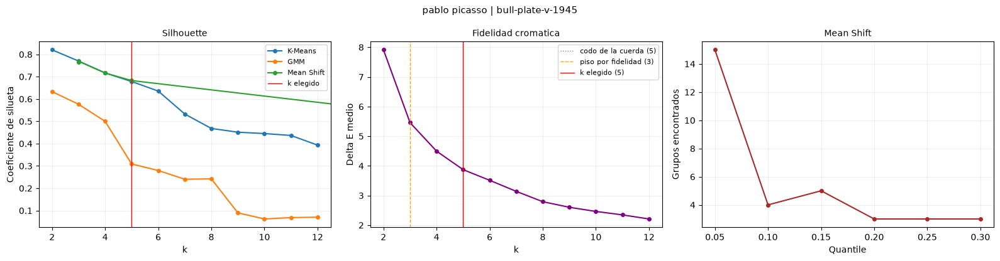

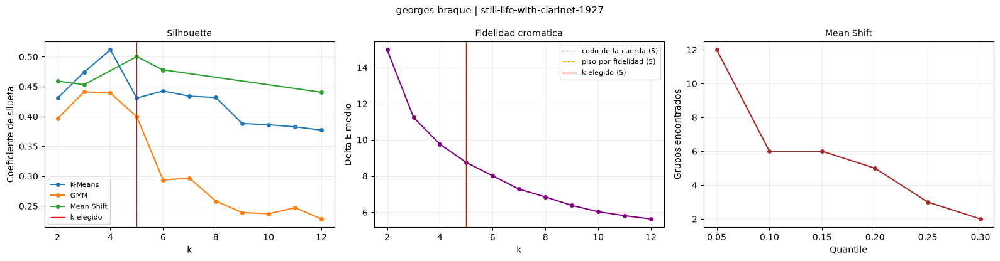

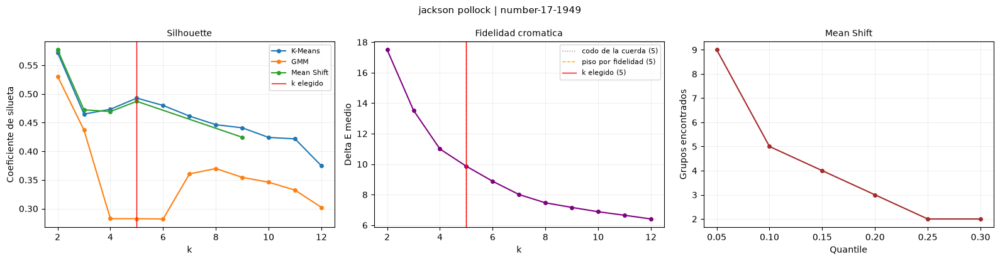

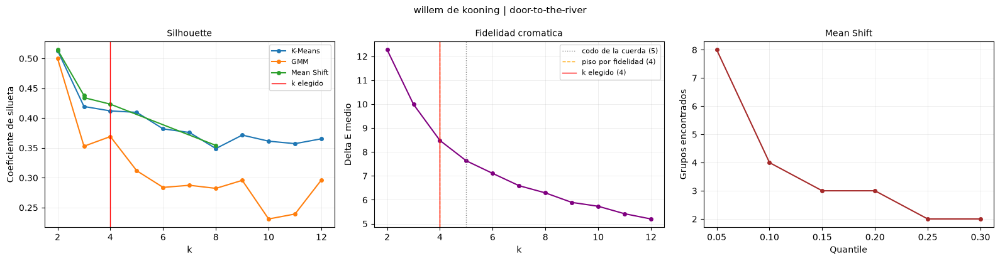

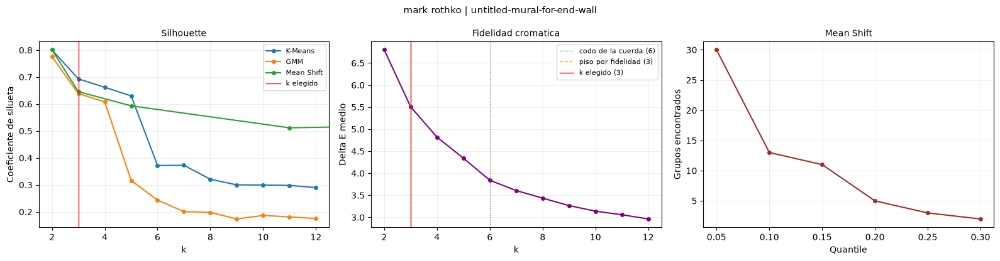

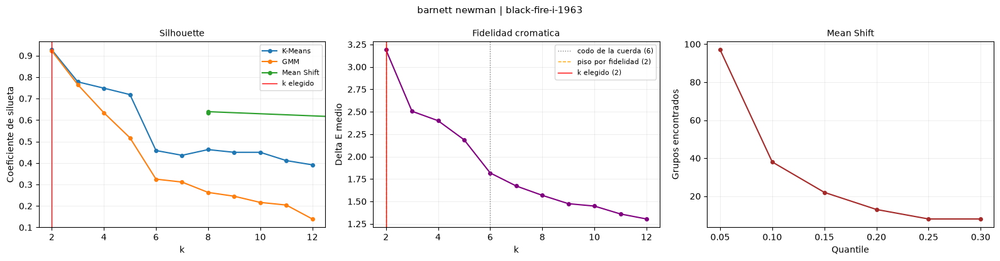

In [133]:
# Curvas diagnosticas por obra. Sirven para validar la regla, no para decidir.

def graficar_diagnostico(clave, tabla, seleccion):
    """Dibuja los tres paneles diagnosticos de una obra.

    Parametros
    ----------
    clave : str
        Identificador de la obra, para el titulo.
    tabla : pd.DataFrame
        Salida de buscar_hiperparametros para esa obra.
    seleccion : dict
        Salida de seleccionar_configuracion, para marcar la eleccion.
    """
    fig, axes = plt.subplots(1, 3, figsize=(16, 4.2))
    k_elegido = seleccion["k"]

    # --- Panel 0: Silhouette vs k ---
    # Aqui debe verse el sesgo hacia k = 2 descrito en la seccion 3.2.
    for algoritmo in ("K-Means", "GMM", "Mean Shift"):
        subtabla = tabla[tabla["algoritmo"] == algoritmo].sort_values("k")

        if subtabla.empty:
            continue

        axes[0].plot(subtabla["k"], subtabla["silhouette"], marker="o",
                     markersize=4, label=algoritmo)

    axes[0].axvline(k_elegido, color="red", linestyle="-", linewidth=1,
                    label="k elegido")
    # Mean Shift puede devolver k muy fuera de la rejilla (k = 74 en algunas
    # obras). Sin acotar el eje, esos puntos estiran la escala y comprimen la
    # zona de interes contra el margen. Se limita al rango de la rejilla; el
    # panel de la derecha muestra de todos modos el recorrido completo.
    axes[0].set_xlim(min(RANGO_K) - 0.5, max(RANGO_K) + 0.5)

    axes[0].set_title("Silhouette", fontsize=10)
    axes[0].set_xlabel("k")
    axes[0].set_ylabel("Coeficiente de silueta")
    axes[0].legend(fontsize=8)

    # --- Panel 1: fidelidad cromatica ---
    # La curva se construye SOLO con K-Means, igual que en
    # seleccionar_configuracion. Si se usara la tabla completa, el grafico
    # mostraria una curva distinta de la que tomo la decision.
    base = tabla[tabla["algoritmo"] == "K-Means"]
    if base.empty:
        base = tabla

    curva = (
        base.groupby("k", as_index=False)["delta_e_medio"]
        .min()
        .sort_values("k")
    )

    axes[1].plot(curva["k"], curva["delta_e_medio"], marker="o", markersize=4,
                 color="purple")

    # El codo de la cuerda se dibuja solo como referencia: es el criterio que
    # se descarto en la seccion 3.3 por proponer casi el mismo k en toda obra.
    axes[1].axvline(seleccion["k_codo"], color="gray", linestyle=":", linewidth=1,
                    label=f"codo de la cuerda ({seleccion['k_codo']})")
    axes[1].axvline(seleccion["k_piso"], color="orange", linestyle="--", linewidth=1,
                    label=f"piso por fidelidad ({seleccion['k_piso']})")
    axes[1].axvline(k_elegido, color="red", linestyle="-", linewidth=1,
                    label=f"k elegido ({k_elegido})")

    axes[1].set_xlabel("k")
    axes[1].set_ylabel("Delta E medio")
    axes[1].set_title("Fidelidad cromatica", fontsize=10)
    axes[1].legend(fontsize=8)

    # --- Panel 2: Mean Shift ---
    # Cuantos modos de densidad encuentra segun la amplitud de la ventana.
    ms = tabla[tabla["algoritmo"] == "Mean Shift"].sort_values("valor")

    if ms.empty:
        axes[2].text(0.5, 0.5, "No hay configuraciones de Mean Shift",
                     ha="center", va="center", fontsize=9, color="gray")
    else:
        axes[2].plot(ms["valor"], ms["k"], marker="o", markersize=4, color="brown")

    axes[2].set_title("Mean Shift", fontsize=10)
    axes[2].set_xlabel("Quantile")
    axes[2].set_ylabel("Grupos encontrados")

    for ax in axes:
        ax.grid(alpha=0.3, linewidth=0.5)

    fig.suptitle(clave, fontsize=11)
    plt.tight_layout()
    plt.show()


# La seleccion se resuelve ANTES de dibujar y en un paso aparte. Si se llenara
# 'selecciones' dentro del bucle que grafica, un fallo al dibujar dejaria el
# diccionario a medias y la seccion 3.6 fallaria por una causa que no es la suya.
selecciones = {
    clave: seleccionar_configuracion(tabla)
    for clave, tabla in resultados_busqueda.items()
}

print(f"Configuraciones seleccionadas: {len(selecciones)} de {len(resultados_busqueda)}")

for clave, tabla in resultados_busqueda.items():
    graficar_diagnostico(clave, tabla, selecciones[clave])


<a id="s3-6"></a>
## 3.6 Resultado de la selección automática

La tabla siguiente resume qué eligió el método para cada obra, sin ninguna intervención. Es la
evidencia central del proyecto y conviene leerla con dos preguntas en mente:

1. **¿Varía el número de grupos entre obras?** Si el método devolviera el mismo $k$ para todas, no
   estaría adaptándose a las características de cada imagen.
2. **¿Coincide esa variación con lo anticipado en §1.1?** Se esperaba que Color Field Painting
   requiriera pocos grupos y que Expresionismo Abstracto requiriera bastantes más. Que la
   predicción cromática hecha *antes* de ver los datos se cumpla es la mejor señal de que el
   criterio captura algo real de las obras y no ruido.

In [134]:
# Tabla resumen de la seleccion automatica.

def resumir_selecciones(obras, selecciones):
    """Consolida en una tabla lo que el metodo decidio para cada obra.

    Parametros
    ----------
    obras : pd.DataFrame
        Conjunto de trabajo, con genero_es, artista y obra.
    selecciones : dict[str, dict]
        Clave "artista | obra" -> salida de seleccionar_configuracion.

    Retorna
    -------
    pd.DataFrame
        genero_es, artista, obra, algoritmo, k, k_piso, k_codo, score_validez,
        silhouette, davies_bouldin, calinski_harabasz, delta_e_medio y
        delta_e_p95.

        Se conserva 'k_codo' junto a 'k_piso' a proposito: es la evidencia de
        por que se descarto el criterio del codo de la cuerda (§3.3). El codo
        propone practicamente el mismo k para todas las obras, mientras que el
        piso por fidelidad si se adapta a cada una.
    """
    columnas = [
        "genero_es", "artista", "obra", "algoritmo", "k", "k_piso", "k_codo",
        "score_validez", "silhouette", "davies_bouldin",
        "calinski_harabasz", "delta_e_medio", "delta_e_p95",
    ]

    filas = []

    for _, fila in obras.iterrows():
        clave = f"{fila['artista']} | {fila['obra']}"

        if clave not in selecciones:
            raise ValueError(f"No hay seleccion para la obra {clave}")

        filas.append({
            "genero_es": fila["genero_es"],
            "artista": fila["artista"],
            "obra": fila["obra"],
            **selecciones[clave],
        })

    resumen = pd.DataFrame(filas, columns=columnas)

    # Los generos se ordenan por su orden de aparicion en 'obras', no
    # alfabeticamente, para que la tabla siga el mismo orden que la galeria de
    # §1.7. dict.fromkeys da los valores unicos preservando ese orden.
    orden_generos = list(dict.fromkeys(obras["genero_es"]))
    resumen["genero_es"] = pd.Categorical(
        resumen["genero_es"], categories=orden_generos, ordered=True
    )

    return resumen.sort_values(["genero_es", "artista"]).reset_index(drop=True)


resumen_seleccion = resumir_selecciones(obras, selecciones)
display(resumen_seleccion)

print(f"Valores distintos de k     : {sorted(int(v) for v in resumen_seleccion['k'].unique())}")
print(f"Algoritmos seleccionados   : {resumen_seleccion['algoritmo'].value_counts().to_dict()}")

# El criterio exige que el numero de grupos se adapte a cada imagen: si todas
# las obras cayeran en el mismo k, el metodo no estaria haciendo su trabajo.
assert resumen_seleccion["k"].nunique() > 1, \
    "El metodo asigno el mismo k a todas las obras: revisar el criterio de §3.3"


,genero_es,artista,obra,algoritmo,k,k_piso,k_codo,score_validez,silhouette,davies_bouldin,calinski_harabasz,delta_e_medio,delta_e_p95
0,Impresionismo,claude monet,the-magpie-1869,K-Means,5,5,5,0.636211,0.412411,0.833095,2.901835e+04,7.054786,15.111332
1,Impresionismo,pierre auguste renoir,on-the-banks-of-the-river-1895,K-Means,5,5,5,0.775607,0.422498,0.820144,4.349094e+04,7.138653,12.517641
2,Cubismo,georges braque,still-life-with-clarinet-1927,Mean Shift,5,5,5,0.880629,0.500253,0.779281,2.319912e+04,9.126522,20.268892
3,Cubismo,pablo picasso,bull-plate-v-1945,K-Means,5,3,5,0.859151,0.678203,0.565074,2.788276e+05,3.872240,9.386812
4,Expresionismo Abstracto,jackson pollock,number-17-1949,K-Means,5,5,5,0.780274,0.492838,0.796306,3.613820e+04,9.864892,18.442663
5,Expresionismo Abstracto,willem de kooning,door-to-the-river,K-Means,4,4,5,0.793292,0.412099,0.863372,2.735491e+04,8.481840,16.678959
6,Color Field Painting,barnett newman,black-fire-i-1963,K-Means,2,2,6,1.000000,0.926888,0.106399,1.043672e+06,3.189811,8.961524
7,Color Field Painting,mark rothko,untitled-mural-for-end-wall,K-Means,3,3,6,0.827816,0.693060,0.575457,1.625576e+05,5.505635,11.525387


Valores distintos de k     : [2, 3, 4, 5]
Algoritmos seleccionados   : {'K-Means': 7, 'Mean Shift': 1}


### Interpretación de la selección automática

Como se puede ver en la tabla anterior, el número de grupos seleccionado se mueve en el rango K ∈ {2, 3, 4, 5}. No es un valor fijo: cambia con cada obra, que es justo lo que buscábamos.

La distribución por género es coherente con lo que anticipamos al armar el conjunto, aunque no exactamente como lo esperábamos. Color Field Painting es el extremo inferior claro: Newman se resolvió con 2 colores y Rothko con 3, y basta mirar las obras para entender por qué — son campos planos y extensos, con muy pocas transiciones. En el otro extremo, impresionismo, cubismo y expresionismo abstracto se agrupan todos entre 4 y 5 grupos, sin diferencias apreciables entre ellos. Conviene señalarlo con honestidad: esperábamos que el expresionismo abstracto destacara por encima del resto y no ocurrió (Pollock 5, De Kooning 4, los mismos valores que Monet y Renoir). La separación que el método realmente encontró es Color Field frente a todo lo demás.

En cuanto a los algoritmos, K-Means ganó en 7 de las 8 obras y Mean Shift solo en Braque. Ese resultado hay que interpretarlo con cuidado, porque buena parte de la ventaja es estructural y no una superioridad en reconocer colores. K-Means minimiza la suma de distancias cuadráticas a los centroides y, como trabajamos en CIELAB, esa cantidad es exactamente nuestra medida de fidelidad $\Delta E$. A eso se suma que las tres métricas internas empleadas están construidas sobre razones de varianza intra e inter grupo, es decir, sobre lo mismo que K-Means optimiza. El algoritmo compite en un terreno que le favorece. Para una comparación más equilibrada habría que densificar la rejilla de cuantiles de Mean Shift, que aporta solo 6 configuraciones frente a las 11 de K-Means y GMM, o incorporar criterios que no premien la compacidad esférica.

El componente de fidelidad fue el que decidió en casi todos los casos: en 7 de las 8 obras el K elegido coincide con el piso. La excepción es Picasso, donde el piso permitía bajar hasta 3 grupos pero el consenso de las métricas prefirió 5. Es el único caso en que el segundo componente del criterio movió la decisión, y confirma que ambos aportan.

Vale la pena mirar además la columna k_codo, que registra lo que habría propuesto el criterio del codo de la cuerda: 5 para seis obras y 6 para las dos de Color Field, prácticamente el mismo valor para todas. Frente al piso por fidelidad, que recorre de 2 a 5, queda claro por qué se descartó: no distinguía una obra de campos planos de un dripping.


<a id="seccion-4"></a>
# 4. Transformación de los grupos en un muestrario

El agrupamiento entrega etiquetas y centros. Un muestrario es otra cosa: un conjunto **pequeño,
ordenado y legible** de colores que un diseñador pueda usar. Esta sección construye la función que
hace esa traducción.

<a id="s4-1"></a>
## 4.1 Qué color representa a cada grupo

Hay tres candidatos naturales para el color representativo de un grupo, y la elección tiene
consecuencias visibles:

| Opción | Qué es | Problema |
|---|---|---|
| **Centroide** (K-Means, Mean Shift) | La media de los píxeles del grupo en CIELAB | Es un **promedio**, y el promedio de un grupo cromáticamente disperso puede caer en un tono apagado que **no aparece en ningún píxel de la obra**. En un grupo que mezcla rojo y verde, el centroide es un gris pardo que el pintor nunca usó. |
| **Media del componente** (GMM) | El vector `means_` de la gaussiana | Mismo problema que el centroide, agravado porque la asignación es blanda. |
| **Medoide** | El **píxel real** más cercano al centro del grupo | Ninguno de los anteriores. |

Se genera el muestrario con el **medoide**. El argumento es directo: la paleta debe estar formada
por colores que **existen realmente en la obra**. Un centroide es una construcción estadística; un
medoide es un píxel que el pintor efectivamente puso en el lienzo.

El coste de calcularlo es despreciable —una búsqueda del mínimo de distancias dentro de cada
grupo— y la ganancia en fidelidad es apreciable sobre todo en obras de gama amplia. En §4.4 se
comparan ambas opciones sobre una misma obra para dejar constancia de la diferencia.

<a id="s4-2"></a>
## 4.2 Post-proceso del muestrario

Los grupos en bruto no forman todavía una paleta utilizable. Se aplican cuatro operaciones, en
este orden:

1. **Fusionar colores redundantes.** Dos grupos cuyos representantes disten menos de
   $\Delta E = 5$ son, a efectos perceptivos, casi el mismo color. Aparecen cuando el algoritmo
   parte una familia cromática amplia en dos mitades arbitrarias. Se fusionan sumando sus
   proporciones. El umbral 5 se sitúa por encima del límite de lo apenas perceptible
   ($\Delta E \approx 2.3$) pero por debajo de lo que se considera un color distinto.

2. **Descartar grupos marginales.** Los grupos que representan menos del **2 %** de los píxeles
   corresponden por lo general a detalles puntuales o a bordes entre regiones, no a tonos
   dominantes de la obra. *Nota:* es una decisión con contrapartida — un acento cromático pequeño
   pero deliberado del artista también cae por debajo del umbral. Se asume conscientemente y se
   señala entre las limitaciones de §7.

3. **Ordenar por luminosidad $L^\ast$.** Presentar los colores de oscuro a claro hace que la paleta
   se lea como una rampa coherente en lugar de como una lista arbitraria. Es una decisión de
   presentación, no altera el contenido.

4. **Convertir de CIELAB a RGB con recorte de gamut.** CIELAB describe más colores de los que un
   monitor sRGB puede mostrar, así que `lab2rgb` puede devolver valores fuera de $[0, 1]$. Hay que
   recortarlos con `np.clip` **antes** de escalar a enteros de 8 bits; omitirlo produce
   desbordamientos y colores completamente erróneos al convertir a `uint8`.

<a id="s4-3"></a>
## 4.3 La función que genera el muestrario

`generar_muestrario` es la función que materializa la transformación pedida: recibe la salida cruda
de cualquiera de los tres algoritmos —etiquetas y centros— y devuelve una paleta lista para usar,
aplicando en orden las cuatro operaciones de §4.2.

Su interfaz es deliberadamente **agnóstica al algoritmo**. No sabe si los centros vienen de
`cluster_centers_` de K-Means, de `means_` de un GMM o de los modos de Mean Shift, y no necesita
saberlo. Esa independencia es lo que permite que el selector automático de §3.3 cambie de algoritmo
según la imagen sin que nada más del método tenga que adaptarse.

In [ ]:
# Funcion que transforma los grupos de colores identificados en un muestrario.

def generar_muestrario(X_lab, etiquetas, centros,
                       proporcion_minima=0.02, delta_e_fusion=5.0,
                       usar_medoide=True):
    """Transforma una particion de pixeles en un muestrario de colores.

    Es la funcion central del entregable: recibe la salida cruda de cualquiera
    de los tres algoritmos y devuelve una paleta lista para usar.

    Parametros
    ----------
    X_lab : ndarray (n, 3)
        Pixeles en CIELAB.
    etiquetas : ndarray (n,)
        Grupo asignado a cada pixel.
    centros : ndarray (k, 3)
        Centro en CIELAB de cada grupo.
    proporcion_minima : float
        Peso minimo para que un grupo entre en la paleta.
    delta_e_fusion : float
        Dos colores a menos de esta distancia CIELAB se fusionan.
    usar_medoide : bool
        True -> el color es el pixel real mas cercano al centro.
        False -> el color es el centro (promedio).

    Retorna
    -------
    pd.DataFrame
        Una fila por color, ordenada por luminosidad, con columnas:
        'hex', 'rgb', 'lab', 'proporcion', 'proporcion_bruta' y 'n_pixeles'.

        'proporcion' esta renormalizada para sumar 1 tras el filtrado;
        'proporcion_bruta' conserva la fraccion real de la obra, de modo que
        1 - proporcion_bruta.sum() indica cuanta imagen quedo fuera de la
        paleta al descartar los grupos por debajo de proporcion_minima.
    """

    total = len(X_lab)

    colores_brutos = []
    for i in np.unique(etiquetas):
        pixeles = X_lab[etiquetas == i]

        if len(pixeles) == 0:
            continue

        centro = centros[i]
        if usar_medoide:
            distancias = np.linalg.norm(pixeles - centro, axis=1)
            color_representativo = pixeles[np.argmin(distancias)]
        else:
            color_representativo = centro

        n_pixeles = len(pixeles)
        colores_brutos.append({"lab": color_representativo, "n_pixeles": n_pixeles})

    #Fusion por cercania, de mayor a menor peso
    colores_brutos.sort(key=lambda x: x["n_pixeles"], reverse=True)
    colores_fusionados = []

    for color in colores_brutos:
        destino = next((
            a for a in colores_fusionados if np.linalg.norm(a["lab"] - color["lab"]) < delta_e_fusion
        ), None)

        if destino is None:
            colores_fusionados.append(dict(color))
        else:
            destino["n_pixeles"] += color["n_pixeles"]

    #Proporciones y filtrado por peso
    for a in colores_fusionados:
        a["proporcion"] = a["n_pixeles"] / total

    #Filtrado
    filtrados = [a for a in colores_fusionados if a["proporcion"] >= proporcion_minima]
    if not filtrados:
        filtrados = [max(colores_fusionados, key=lambda x: x["proporcion"])]

    #Renormalizacion de proporciones
    suma = sum(a["proporcion"] for a in filtrados)
    for a in filtrados:
        a["proporcion_norm"] = a["proporcion"] / suma

    #6. Conversion a RGB y hex
    labs = np.array([a["lab"] for a in filtrados])
    rgbs = np.round(np.clip(lab2rgb(labs), 0, 1) * 255).astype(np.uint8)

    muestrario = pd.DataFrame({
        "hex": [f"#{r:02X}{g:02X}{b:02X}" for r, g, b in rgbs],
        "rgb": [tuple(int(v) for v in c) for c in rgbs],
        "lab": [np.round(a["lab"], 2) for a in filtrados],
        "proporcion": [a["proporcion_norm"] for a in filtrados],
        "proporcion_bruta": [a["proporcion"] for a in filtrados],
        "n_pixeles": [a["n_pixeles"] for a in filtrados]
    })

    #7. Ordenar por luminosidad L
    muestrario["_L"] = labs[:, 0]
    return (
        muestrario.sort_values("_L", ascending=True)
        .drop(columns="_L")
        .reset_index(drop=True)
    )

def dibujar_muestrario(muestrario, ax=None, mostrar_hex=True, titulo=None):
    """Dibuja la paleta como franjas de ancho proporcional al peso de cada color.

    El ancho de cada franja comunica la dominancia del color en la obra, que es
    informacion que una lista de cuadros iguales perderia.
    """

    if ax is None:
        _, ax = plt.subplots(figsize=(10, 1.8))

    inicio = 0.0

    for _, color in muestrario.iterrows():
        ancho = color["proporcion"]
        rgb = np.array(color["rgb"])/255

        ax.barh(0, width=ancho, left=inicio, color=rgb, height=1)

        if mostrar_hex and ancho >= 0.06:
            L = color["lab"][0]
            ax.text(inicio + ancho/2, 0, color["hex"], ha='center', va='center', color='white' if L < 50 else 'black')

        inicio += ancho

    ax.set_xlim(0, 1)
    ax.set_ylim(-0.5, 0.5)
    ax.axis("off")

    if titulo:
        ax.set_title(titulo, fontsize=10)

    return ax

<a id="s4-4"></a>
## 4.4 Reconstrucción de la imagen segmentada

Una forma directa de comprobar si una paleta representa bien a su obra es **repintar la obra usando
solo esos colores**. Si la versión reducida sigue siendo reconocible, la paleta captura lo
esencial; si se vuelve irreconocible, el número de grupos se quedó corto.

Esta imagen segmentada es también el vínculo visual entre el modelo y el resultado, y se incluye en
las figuras finales de la sección 6.

In [ ]:
# Reconstruccion de la imagen usando unicamente los colores de la paleta.

def segmentar_imagen(imagen_rgb, muestrario):
    """Repinta la imagen sustituyendo cada pixel por el color mas cercano de la paleta.

    Parametros
    ----------
    imagen_rgb : ndarray (alto, ancho, 3) uint8
        Imagen preparada, tal como la devuelve pipeline[:2].
    muestrario : pd.DataFrame
        Salida de generar_muestrario.

    Retorna
    -------
    ndarray (alto, ancho, 3) uint8
    """

    alto, ancho = imagen_rgb.shape[:2]

    pixeles = rgb2lab(imagen_rgb).reshape(-1, 3)
    paleta_lab = np.vstack(muestrario["lab"].to_numpy())
    # np.vstack(..., dtype=uint8) falla: no permite estrechar desde int64.
    paleta_rgb = np.array(muestrario["rgb"].tolist(), dtype=np.uint8)

    indices = pairwise_distances_argmin(pixeles, paleta_lab)

    return paleta_rgb[indices].reshape(alto, ancho, 3)


<a id="s4-5"></a>
## 4.5 Prueba de la función y comparación medoide *vs* centroide

Se aplica la función a una de las obras y se contrastan las dos variantes discutidas en §4.1, para
dejar evidencia de por qué se eligió el medoide.

,hex,rgb,lab,proporcion,proporcion_bruta,n_pixeles
0,#322619,"(50, 38, 25)","[16.18, 3.45, 10.77]",0.06155,0.06155,1231
1,#847161,"(132, 113, 97)","[48.98, 4.78, 11.64]",0.08625,0.08625,1725
2,#8F98B2,"(143, 152, 178)","[62.94, 2.41, -14.6]",0.17410,0.17410,3482
3,#B4B0B2,"(180, 176, 178)","[72.21, 1.78, -0.51]",0.25300,0.25300,5060
4,#DBD3D0,"(219, 211, 208)","[85.1, 2.22, 2.46]",0.42510,0.42510,8502


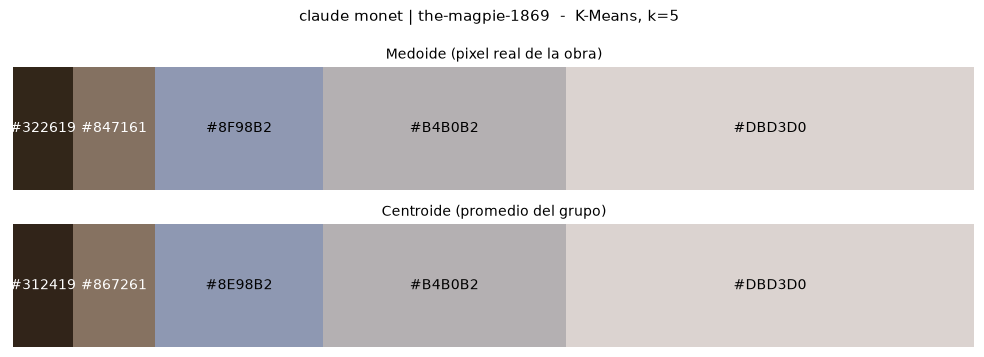

Delta E entre ambos criterios, color a color: [1.11 1.03 0.27 0.26 0.17]
Diferencia media: 0.57   maxima: 1.11
Referencia: Delta E < 2.3 se considera indistinguible a simple vista.


In [137]:
# Prueba de generar_muestrario sobre una obra, comparando medoide y centroide.

clave_prueba = list(selecciones.keys())[0]
seleccion_prueba = selecciones[clave_prueba]
X_prueba = muestras_lab[clave_prueba]

# La configuracion ganadora guarda el nombre del hiperparametro y su valor por
# separado ('parametro' y 'valor'), asi que se reconstruye el dict que espera
# ajustar_modelo: {"k": 5} para K-Means y GMM, {"quantile": 0.1} para Mean Shift.
algoritmo = seleccion_prueba["algoritmo"]
parametros = {seleccion_prueba["parametro"]: seleccion_prueba["valor"]}

etiquetas, centros, modelo = ajustar_modelo(X_prueba, algoritmo, parametros)

# usar_medoide va POR NOMBRE: es el sexto parametro de la funcion, y pasarlo
# como cuarto posicional cambiaria proporcion_minima en su lugar.
muestrario_medoide = generar_muestrario(X_prueba, etiquetas, centros, usar_medoide=True)
muestrario_centroide = generar_muestrario(X_prueba, etiquetas, centros, usar_medoide=False)

display(muestrario_medoide)

fig, axes = plt.subplots(2, 1, figsize=(10, 3.6))

dibujar_muestrario(muestrario_medoide, ax=axes[0], titulo="Medoide (pixel real de la obra)")
dibujar_muestrario(muestrario_centroide, ax=axes[1], titulo="Centroide (promedio del grupo)")

fig.suptitle(
    f"{clave_prueba}  -  {algoritmo}, k={seleccion_prueba['k']}",
    fontsize=11,
)
plt.tight_layout()
plt.show()

if len(muestrario_medoide) == len(muestrario_centroide):
    a = np.vstack(muestrario_medoide["lab"].to_numpy())
    b = np.vstack(muestrario_centroide["lab"].to_numpy())

    diferencias = np.linalg.norm(a - b, axis=1)

    print("Delta E entre ambos criterios, color a color:",
          np.round(diferencias, 2))
    print(f"Diferencia media: {diferencias.mean():.2f}   maxima: {diferencias.max():.2f}")
    print("Referencia: Delta E < 2.3 se considera indistinguible a simple vista.")

else:
    print(f"Distinto numero de colores: {len(muestrario_medoide)} con medoide, "
          f"{len(muestrario_centroide)} con centroide.")


### Resultado de la comparación

La paleta quedó con 5 colores, exactamente el K que el método había seleccionado para esta obra en §3.6. Ni el filtro del 2 % ni la fusión por cercanía eliminaron ningún grupo, lo que indica que los cinco tienen peso suficiente y están bien separados entre sí.

Al comparar el medoide con el centroide, las diferencias resultan imperceptibles a simple vista: el $\Delta E$ color a color va de 0.17 a 1.11, con una media de 0.57, muy por debajo del umbral de 2.3 que se considera indistinguible. De hecho, dos de los cinco colores coinciden exactamente en su valor hexadecimal.

Conviene ser honestos con lo que esperábamos. En §4.1 argumentamos que el centroide, por ser un promedio, tendería a producir tonos más apagados. Al medirlo en esta obra no se cumple: el croma medio es 8.77 con medoide y 8.85 con centroide, prácticamente idéntico y con el centroide incluso algo más saturado. La explicación está en la propia obra: The Magpie es una escena de nieve, y sus grupos son tan compactos y tan próximos al gris neutro —en el diagrama $a^\ast b^\ast$ de §2.6 su nube aparecía como una franja estrecha pegada al origen— que promediar dentro de cada grupo apenas desplaza el color. El argumento a favor del medoide sigue siendo válido, pero su ventaja debería apreciarse en obras de gama más amplia, como el Pollock o el Braque, no en esta.

La paleta resultante son grises, azules apagados y marrones, coherente con una escena invernal. Es un buen recordatorio de que el muestrario describe la obra concreta.

<a id="seccion-5"></a>
# 5. Distribución de los colores en dos dimensiones

<a id="s5-1"></a>
## 5.1 Por qué t-SNE

Los píxeles viven en el espacio tridimensional CIELAB. Proyectarlos a dos dimensiones permite
inspeccionar visualmente **la forma de la nube de colores** de una obra y comprobar si los grupos
que el algoritmo encontró se corresponden con acumulaciones reales o son cortes arbitrarios de un
continuo.

**t-SNE** es apropiado para esta tarea porque preserva los **vecindarios locales**: modela la
similitud entre puntos como una distribución de probabilidad y busca una configuración en 2D cuya
distribución se le parezca. Los píxeles perceptualmente próximos quedan próximos en el mapa, que es
justo lo que se quiere examinar.

### Sus limitaciones, que conviene declarar

- **Las distancias entre nubes no son interpretables.** Que dos grupos aparezcan lejos en el mapa no
  significa que sus colores sean muy distintos. t-SNE conserva la estructura local, no la global.
- **Los tamaños relativos de las nubes tampoco lo son.** El algoritmo tiende a expandir los grupos
  densos y a comprimir los dispersos.
- **Depende de `perplexity`**, que regula cuántos vecinos se consideran. Se usa 30, valor habitual
  para muestras de algunos miles de puntos.
- **No es determinista.** Se fija `random_state=SEMILLA` para que el resultado sea reproducible.

Por estas razones se acompaña de **PCA** como control. PCA sí preserva la estructura global —sus
ejes son las direcciones de máxima varianza y las distancias grandes conservan su significado—,
así que ambas vistas se complementan: PCA indica cómo se reparte la varianza cromática de la obra y
t-SNE revela la estructura fina de los grupos.

<a id="s5-2"></a>
## 5.2 Funciones de proyección y visualización

Se implementan dos funciones. `proyectar_2d` reduce los píxeles CIELAB a dos dimensiones con t-SNE
o con PCA, submuestreando antes porque t-SNE es costoso. `graficar_distribucion` dibuja la nube
resultante con dos modos de coloreado: por el **color real** de cada píxel, que muestra la gama de
la obra, o por el **color de su grupo**, que muestra cómo quedó la partición. Comparar ambos
paneles es lo que permite juzgar si la partición sigue la estructura de los datos.

In [ ]:
# Proyeccion de los pixeles a dos dimensiones.

def proyectar_2d(X_lab, metodo="tsne", n_muestra=3000, perplexity=30, semilla=SEMILLA):
    """Proyecta los pixeles CIELAB a dos dimensiones.

    Parametros
    ----------
    X_lab : ndarray (n, 3)
    metodo : {"tsne", "pca"}
    n_muestra : int
        t-SNE es costoso; se submuestrea antes de proyectar.
    perplexity : int
        Numero efectivo de vecinos que considera t-SNE.

    Retorna
    -------
    coords : ndarray (m, 2)
        Coordenadas proyectadas.
    indices : ndarray (m,)
        Indices de los pixeles usados, para poder recuperar su color y su
        etiqueta y mantener la correspondencia con X_lab.
    info : dict
        Datos adicionales del metodo. En PCA incluye 'varianza_explicada',
        la fraccion de varianza que conservan las dos componentes. t-SNE no
        tiene equivalente porque no preserva distancias globales.
    """

    if len(X_lab) > n_muestra:
        rng = np.random.default_rng(semilla)
        indices = rng.choice(len(X_lab), size = n_muestra, replace= False)
    else:
        indices = np.arange(len(X_lab))

    X = X_lab[indices]
    info = {}

    if metodo == "tsne":
        modelo = TSNE(
            n_components=2,
            perplexity=min(perplexity, len(indices)-1),
            random_state=semilla,
            init="pca"
        )
        coords = modelo.fit_transform(X)

    elif metodo == "pca":
        modelo = PCA(n_components=2, random_state=semilla)
        coords = modelo.fit_transform(X)
        info["varianza_explicada"] = modelo.explained_variance_ratio_.sum()

    else:
        raise ValueError(
            f"metodo debe ser 'tsne' o 'pca', se recibio {metodo!r}"
        )

    return coords, indices, info



def graficar_distribucion(coords, colores_rgb, etiquetas=None, colores_paleta=None,
                          ax=None, titulo=None):
    """Dibuja la nube de colores proyectada.

    Dos modos de coloreado, segun lo que se quiera mostrar:
    - Sin 'etiquetas': cada punto se pinta con SU color real, de modo que el
      grafico muestra la gama cromatica de la obra tal cual.
    - Con 'etiquetas': cada punto se pinta con el color de su grupo, de modo que
      el grafico muestra como quedo la particion.
    """

    if ax is None: 
        _, ax = plt.subplots(figsize = (5,5))

    if etiquetas is None: 
        colores = np.asarray(colores_rgb) / 255

    else:
        if colores_paleta is None: 
            raise ValueError("Falta colores de paleta")
        colores = np.asarray(colores_paleta)[etiquetas]/255

    ax.scatter(
        coords[:, 0], coords[:, 1],
        c = colores, s=4, alpha= 0.6, linewidths= 0
    )

    ax.set_xticks([])
    ax.set_yticks([])

    if titulo:
        ax.set_title(titulo, fontsize = 10)

    return ax

<a id="s5-3"></a>
## 5.3 Prueba sobre una obra: t-SNE frente a PCA

Se proyecta la misma obra con ambos métodos y se colorea de las dos formas descritas, lo que da
cuatro paneles. La comparación permite juzgar si la separación que se observa en t-SNE es una
propiedad de los datos o un artefacto de la proyección.

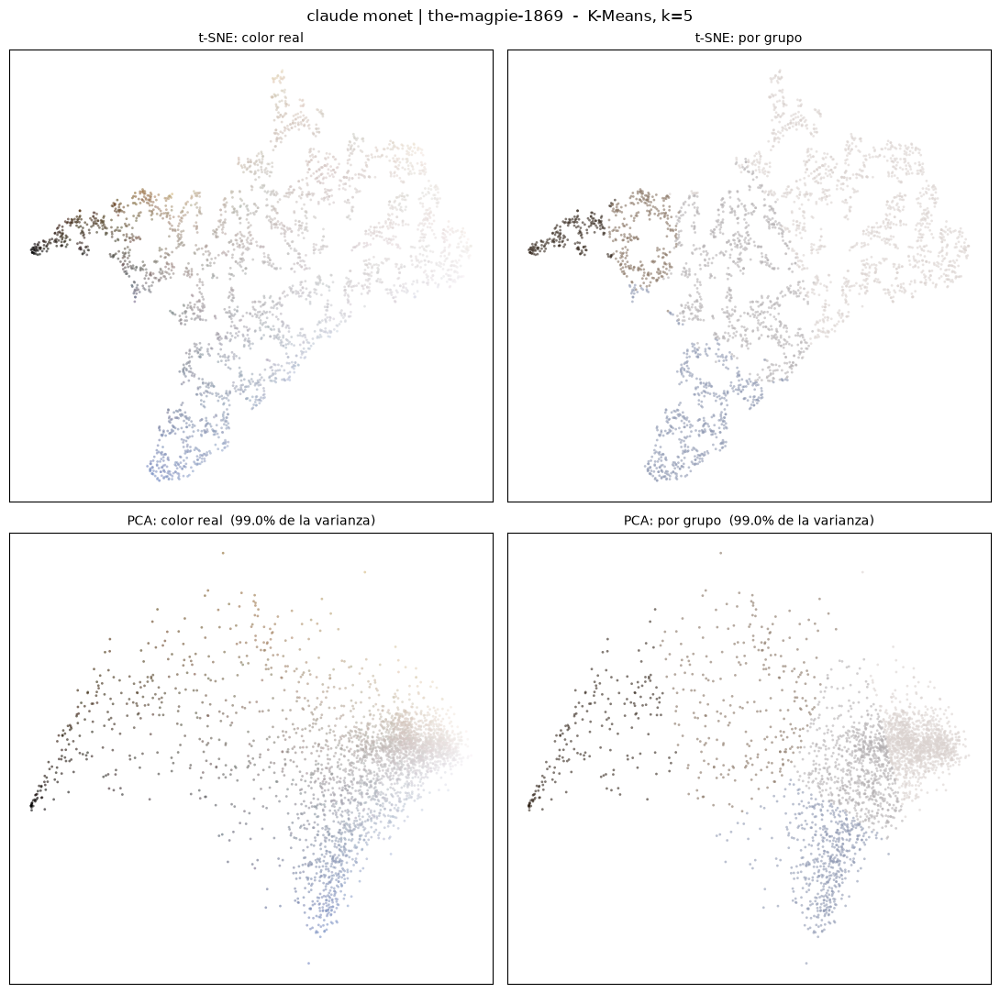

In [139]:
# Comparacion t-SNE / PCA sobre la obra de prueba, con ambos modos de coloreado.

# Color representativo de cada grupo, para el panel coloreado por particion.
colores_grupo = np.round(np.clip(lab2rgb(centros), 0, 1) * 255).astype(np.uint8)

proyecciones = {
    "t-SNE": proyectar_2d(X_prueba, metodo="tsne"),
    "PCA": proyectar_2d(X_prueba, metodo="pca"),
}

fig, axes = plt.subplots(2, 2, figsize=(11, 11))

for fila, (nombre, (coords, indices, info)) in zip(axes, proyecciones.items()):

    # Color real de cada pixel proyectado. Cada metodo submuestrea por su
    # cuenta, asi que hay que usar los indices que devolvio esa proyeccion.
    colores_reales = np.round(
        np.clip(lab2rgb(X_prueba[indices]), 0, 1) * 255
    ).astype(np.uint8)

    # Solo PCA informa cuanta varianza conserva la proyeccion.
    sufijo = ""
    if "varianza_explicada" in info:
        sufijo = f"  ({info['varianza_explicada']:.1%} de la varianza)"

    graficar_distribucion(
        coords, colores_reales,
        ax=fila[0],
        titulo=f"{nombre}: color real{sufijo}",
    )

    graficar_distribucion(
        coords, colores_reales,
        etiquetas=etiquetas[indices],
        colores_paleta=colores_grupo,
        ax=fila[1],
        titulo=f"{nombre}: por grupo{sufijo}",
    )

fig.suptitle(
    f"{clave_prueba}  -  {seleccion_prueba['algoritmo']}, k={seleccion_prueba['k']}",
    fontsize=12,
)
plt.tight_layout()
plt.show()


### Lectura de la proyección

Las dos proyecciones cuentan la misma historia con distinto nivel de ruido. t-SNE produce una figura fragmentada, con filamentos e islas separadas por huecos, mientras que PCA devuelve una nube continua y alargada, sin cortes internos.

Esa diferencia hay que leerla con cuidado, y aquí el porcentaje de varianza es decisivo: PCA conserva el 99,0 % de la varianza con solo dos componentes. La distribución de colores de esta obra es prácticamente plana y cabe casi entera en el plano, de modo que lo que muestra el panel de PCA es la estructura real y no una versión deformada. Los huecos que aparecen en t-SNE no corresponden entonces a separaciones existentes en el espacio CIELAB: son producto de cómo el algoritmo separa vecindarios locales.

La impresión de que los tonos se ordenan de oscuro a claro hacia la derecha resultó ser literal. Al correlacionar las coordenadas con los canales originales, el eje horizontal de PCA tiene correlación +1.00 con $L^\ast$ y el vertical +0.98 con $b^\ast$: los ejes de la proyección no son abstractos, la primera componente es la luminosidad y la segunda es el eje azul-amarillo. En t-SNE las mismas correlaciones son +0.90 y +0.83, algo más difusas pero con idéntica orientación.

El canal $a^\ast$ (verde-rojo) no aparece en ninguno de los dos ejes, con correlaciones por debajo de 0.30 en valor absoluto. Es coherente con lo visto en §2.6, donde la nube de esta obra era una franja estrecha pegada al origen del plano $a^\ast b^\ast$. The Magpie es una escena de nieve: su variación cromática ocurre casi toda entre claro y oscuro y entre azul y amarillo, apenas entre verde y rojo. Por eso bastan dos dimensiones para describirla.

En cuanto a la partición, los grupos del panel derecho ocupan regiones contiguas y no se entremezclan, lo que indica que K-Means con $k=5$ siguió la estructura real de la nube. Ahora bien, al ser esa nube un continuo y no un conjunto de cúmulos separados, las fronteras entre grupos son cortes en un degradado más que separaciones naturales. Es lo esperable en una obra impresionista, y coincide con lo que anticipamos al escoger el género en §1.1.

<a id="seccion-6"></a>
# 6. Demostración del desempeño del método

<a id="s6-1"></a>
## 6.1 Función integradora

Todo lo construido se reúne en una única función, `analizar_obra`, que recibe **la ruta de una
imagen** y devuelve su paleta y su proyección 2D.

Conviene fijarse en su firma: entre sus parámetros **no está el número de grupos ni el nombre del
algoritmo**. No puede estarlo. Ambos son *salidas* de la función, decididas internamente por el
criterio de §3.3 a partir de las características cromáticas de la imagen recibida. Es lo que
permite aplicarla a obras que no participaron en ninguna decisión de diseño, como se hace en §6.4.

In [ ]:
# Metodo completo, de extremo a extremo, en una sola llamada.

def analizar_obra(ruta, lado_maximo=LADO_MAXIMO, n_maximo=N_MAXIMO,
                  proporcion_minima=0.02, delta_e_fusion=5.0, semilla=SEMILLA):
    """Extrae la paleta de colores dominantes de una imagen cualquiera.

    Encadena: preparacion -> busqueda de hiperparametros -> seleccion
    automatica -> muestrario -> imagen segmentada -> proyeccion 2D.

    No recibe el numero de grupos ni el algoritmo: los determina a partir de
    la imagen. Esa es la propiedad que hace que el metodo se pueda aplicar a
    una obra nunca vista.

    Parametros
    ----------
    ruta : str
        Ruta de la imagen a analizar.

    Retorna
    -------
    dict con las claves:
        'imagen'      ndarray (alto, ancho, 3) uint8, imagen preparada
        'segmentada'  ndarray de la imagen repintada con la paleta
        'muestrario'  DataFrame de la paleta
        'seleccion'   dict con algoritmo, k y metricas elegidas
        'tabla'       DataFrame con todas las configuraciones evaluadas
        'coords'      ndarray (m, 2) de la proyeccion t-SNE
        'etiquetas'   ndarray (m,) del grupo de cada punto proyectado
        'colores'     ndarray (m, 3) del color RGB real de cada punto proyectado
    """
    
    #Pipeline
    pipeline = construir_pipeline(lado_maximo, n_maximo, "lab", semilla)
    X = pipeline.fit_transform(ruta)
    imagen = pipeline[:2].transform(ruta)

    #Busqueda y seleccion
    tabla = buscar_hiperparametros(X, semilla)
    if tabla.empty:
        raise RuntimeError(f"Ninguna configuracion valida para {ruta}")
    
    seleccion = seleccionar_configuracion(tabla)

    #Ganador
    etiquetas, centros, _ = ajustar_modelo(
        X, seleccion["algoritmo"], {seleccion["parametro"]:seleccion["valor"]}, semilla
    )

    #Paleta de colores
    muestrario = generar_muestrario(
        X, etiquetas, centros, proporcion_minima, delta_e_fusion
    )
    segmentada = segmentar_imagen(imagen, muestrario)

    #Proyeccion
    # Los argumentos van POR NOMBRE: la firma es
    # (X_lab, metodo, n_muestra, perplexity, semilla), asi que pasar la semilla
    # en tercera posicion la convertiria en n_muestra. El metodo ademas se
    # compara en minusculas.
    coords, indices, info = proyectar_2d(X, metodo="tsne", semilla=semilla)

    colores = np.round(np.clip(lab2rgb(X[indices]), 0, 1) * 255).astype(np.uint8)

    return {
        "imagen": imagen, 
        "segmentada": segmentada, 
        "muestrario": muestrario, 
        "seleccion": seleccion, 
        "tabla": tabla, 
        "coords": coords,
        "etiquetas": etiquetas[indices],
        "colores": colores,
        # 'centros' lo necesita mostrar_resultado para pintar la nube por grupo.
        "centros": centros,
        "info": info,
    }


def mostrar_resultado(resultado, titulo=None):
    """Figura de cuatro paneles que resume el analisis de una obra.

    original | segmentada con la paleta | muestrario | distribucion t-SNE
    """

    seleccion = resultado["seleccion"]

    fig = plt.figure(figsize=(19, 4.6))
    gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 0.8, 1])

    # Panel 0: imagen preparada
    ax0 = fig.add_subplot(gs[0])
    ax0.imshow(resultado["imagen"])
    ax0.set_title("Original", fontsize=10)
    ax0.axis("off")

    # Panel 1: imagen repintada con la paleta
    ax1 = fig.add_subplot(gs[1])
    ax1.imshow(resultado["segmentada"])
    ax1.set_title(
        f"Segmentada — {seleccion['algoritmo']}, k={seleccion['k']}",
        fontsize=10,
    )
    ax1.axis("off")

    # Panel 2: muestrario
    ax2 = fig.add_subplot(gs[2])
    error = seleccion["delta_e_medio"]
    dibujar_muestrario(
        resultado["muestrario"], ax=ax2,
        titulo=f"Paleta ({len(resultado['muestrario'])} colores) — ΔE {error:.1f}",
    )

    # Panel 3: distribucion coloreada por grupo
    ax3 = fig.add_subplot(gs[3])
    colores_grupo = np.round(
        np.clip(lab2rgb(resultado["centros"]), 0, 1) * 255
    ).astype(np.uint8)
    graficar_distribucion(
        resultado["coords"], resultado["colores"],
        etiquetas=resultado["etiquetas"], colores_paleta=colores_grupo,
        ax=ax3, titulo="Distribucion por grupo",
    )

    if titulo:
        fig.suptitle(titulo, fontsize=12)

    plt.tight_layout()
    plt.show()

<a id="s6-2"></a>
## 6.2 Resultados sobre el conjunto de trabajo

Se aplica el método completo a las ocho obras. El enunciado exige mostrar al menos cuatro obras de
estilos diferentes con su paleta y su distribución en dos dimensiones; se presentan las ocho para
cubrir los cuatro géneros con dos ejemplos cada uno.

Cada figura permite verificar la cadena entera de un vistazo: si la imagen segmentada conserva la
identidad de la obra, la paleta es fiel; si la nube t-SNE muestra grupos coherentes, la partición
sigue la estructura real de los colores.

[1/8] jackson pollock | number-17-1949


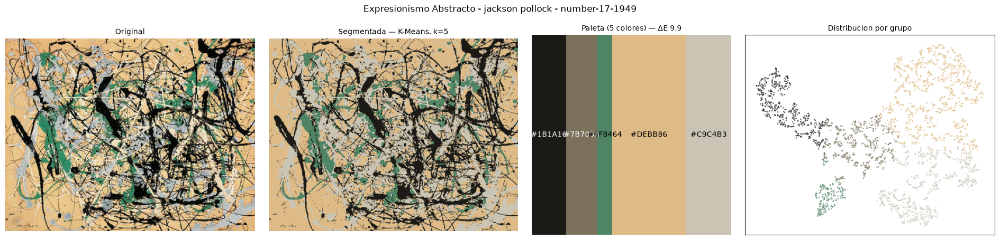

[2/8] willem de kooning | door-to-the-river


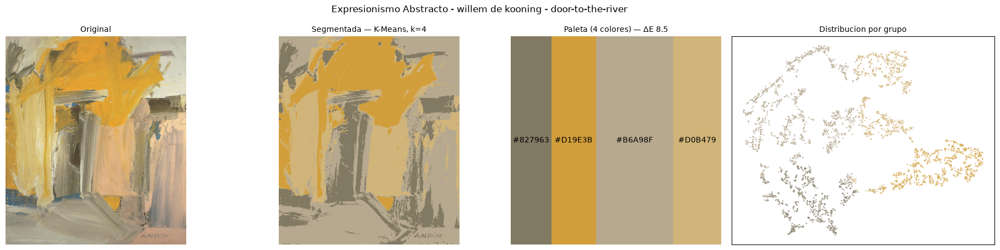

[3/8] mark rothko | untitled-mural-for-end-wall


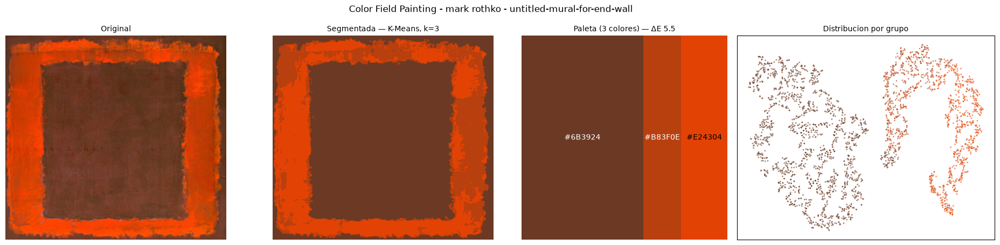

[4/8] barnett newman | black-fire-i-1963


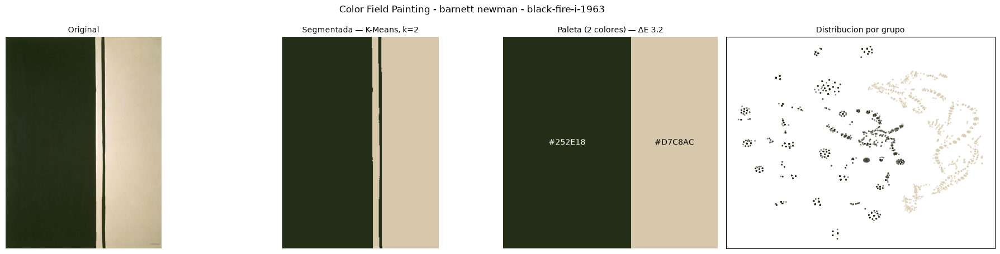

[5/8] pablo picasso | bull-plate-v-1945


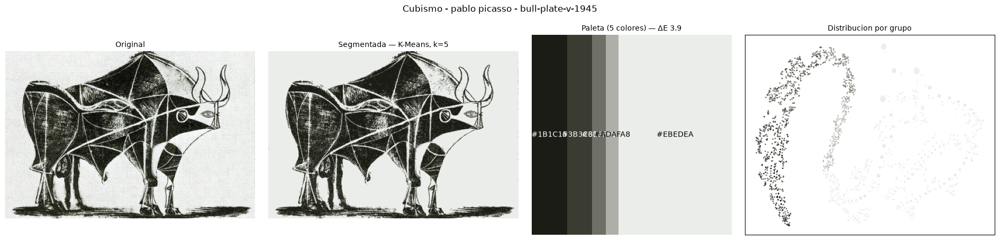

[6/8] georges braque | still-life-with-clarinet-1927


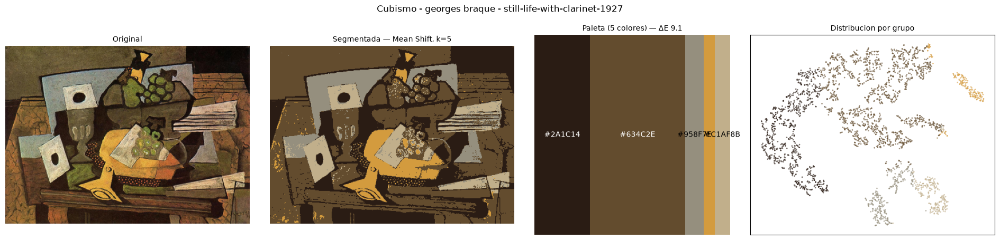

[7/8] claude monet | the-magpie-1869


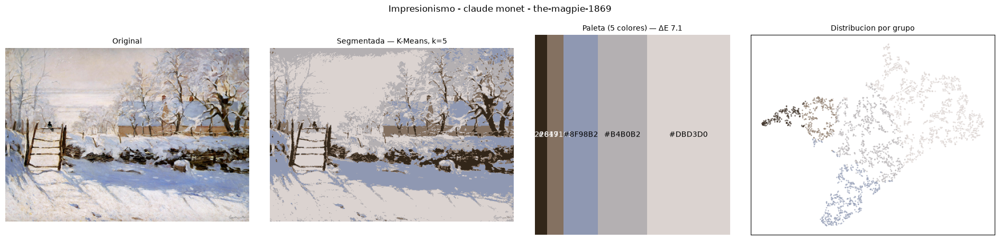

[8/8] pierre auguste renoir | on-the-banks-of-the-river-1895


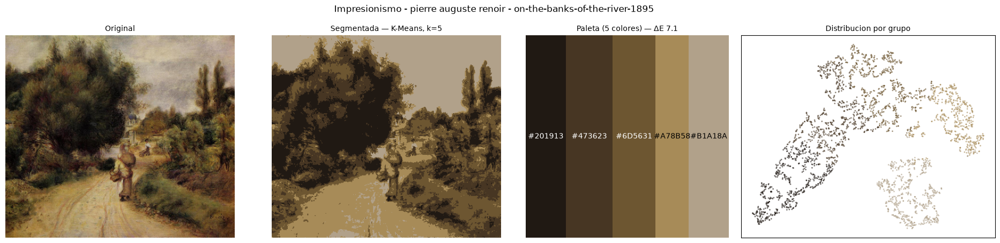


Obras analizadas: 8


In [ ]:
# Aplicacion del metodo completo a las ocho obras.

resultados_finales = {}

for i, (_, fila) in enumerate(obras.sort_values("genero").iterrows(), start=1):
    clave = f"{fila['artista']} | {fila['obra']}"
    print(f"[{i}/{len(obras)}] {clave}", flush=True)

    resultados_finales[clave] = analizar_obra(fila["ruta_local"], semilla=SEMILLA)

    mostrar_resultado(
        resultados_finales[clave],
        titulo=f"{fila['genero_es']} - {fila['artista']} - {fila['obra']}",
    )

print(f"\nObras analizadas: {len(resultados_finales)}")


### Lectura de los resultados por género

Color Field Painting confirmó lo anticipado en §1.1: es el único género que bajó de cuatro grupos, con 2 colores en Newman y 3 en Rothko. Son las paletas más pequeñas del conjunto y también de las más fieles —$\Delta E$ de 3,2 y 5,5—, así que la imagen segmentada resulta casi indistinguible de la original. Sus nubes t-SNE son además las más legibles: manchas separadas por huecos claros, porque los colores forman acumulaciones realmente disjuntas.

En el resto de los géneros el método se movió entre 4 y 5 grupos sin diferencias apreciables, y conviene señalarlo con honestidad: el cubismo no resultó ser un género de pocos colores. Braque y Picasso obtuvieron 5 grupos cada uno, los mismos que Monet y Renoir y por encima de De Kooning. La separación que el método encontró es Color Field frente a todo lo demás, no el escalonamiento entre cuatro géneros que suponíamos.

Las nubes t-SNE se dejan agrupar en dos tipos. Unas se fragmentan en islas nítidas, lo que ocurre cuando la obra tiene pocos colores bien diferenciados. Otras forman una masa continua en la que las fronteras entre grupos son cortes en un degradado más que separaciones naturales; es el caso del impresionismo, donde las pinceladas yuxtapuestas producen transiciones sin huecos, y donde grupos vecinos acaban compartiendo colores muy próximos.

El azul del bodegón de Braque merece una explicación aparte. A simple vista la obra tiene acentos fríos que no aparecen en la paleta, formada íntegramente por ocres, marrones y cremas. Al medirlo, el mecanismo resultó distinto del que suponíamos: los píxeles azulados ocupan apenas el 0,88 % del lienzo y son tonos muy tenues —el más frío llega a $b^\ast = -9{,}7$, colores como #596269 o #8D9FA5, grises azulados más que azules—. El 80 % de ellos terminó absorbido por el grupo gris.

Es importante distinguir este caso del de Jo Baer en §6.4. Allí los colores sí formaron grupos propios y fue el filtro del 2 % el que los descartó. Aquí el azul nunca llegó a formar un grupo: con menos del 1 % de los píxeles no constituye un modo de densidad que Mean Shift pueda aislar, de modo que se fundió con el gris más cercano antes de que ningún filtro interviniera. La cobertura de esta paleta es del 100 %, es decir, no se descartó nada.

Son dos limitaciones distintas —una de la etapa de agrupación, otra del post-proceso— y ambas golpean en el mismo punto: los acentos cromáticos de poca superficie.

<a id="s6-3"></a>
## 6.3 Comparación global

Se consolidan los resultados de las ocho obras para observar el comportamiento del método en
conjunto: qué relación hay entre el género y el número de colores de la paleta, y qué fidelidad
cromática se alcanzó en cada caso.

,genero_es,artista,obra,algoritmo,k,n_colores_paleta,delta_e_medio,delta_e_p95,cobertura,silhouette,davies_bouldin,calinski_harabasz
0,Impresionismo,claude monet,the-magpie-1869,K-Means,5,5,7.054786,15.111332,1.0,0.412411,0.833095,2.901835e+04
1,Impresionismo,pierre auguste renoir,on-the-banks-of-the-river-1895,K-Means,5,5,7.138653,12.517641,1.0,0.422498,0.820144,4.349094e+04
2,Cubismo,pablo picasso,bull-plate-v-1945,K-Means,5,5,3.872240,9.386812,1.0,0.678203,0.565074,2.788276e+05
3,Cubismo,georges braque,still-life-with-clarinet-1927,Mean Shift,5,5,9.126522,20.268892,1.0,0.500253,0.779281,2.319912e+04
4,Expresionismo Abstracto,jackson pollock,number-17-1949,K-Means,5,5,9.864892,18.442663,1.0,0.492838,0.796306,3.613820e+04
5,Expresionismo Abstracto,willem de kooning,door-to-the-river,K-Means,4,4,8.481840,16.678959,1.0,0.412099,0.863372,2.735491e+04
6,Color Field Painting,mark rothko,untitled-mural-for-end-wall,K-Means,3,3,5.505635,11.525387,1.0,0.693060,0.575457,1.625576e+05
7,Color Field Painting,barnett newman,black-fire-i-1963,K-Means,2,2,3.189811,8.961524,1.0,0.926888,0.106399,1.043672e+06


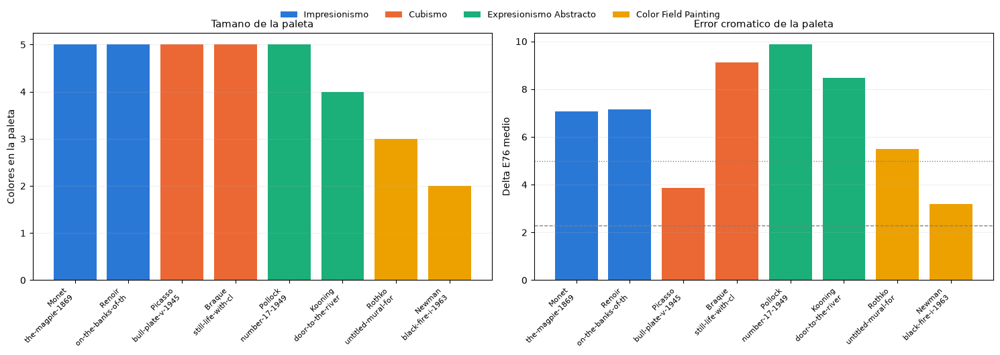

In [142]:
# Tabla y grafico comparativos de las ocho obras.

def comparar_resultados(obras, resultados):
    """Consolida los resultados finales en una tabla comparativa.

    Retorna
    -------
    pd.DataFrame
        genero_es, artista, obra, algoritmo, k, n_colores_paleta,
        delta_e_medio, delta_e_p95, cobertura y las tres metricas internas.

        'cobertura' es la suma de proporcion_bruta: la fraccion de la obra que
        la paleta representa realmente, una vez descartados los grupos por
        debajo de proporcion_minima. Cuanto mas baja, mas imagen quedo fuera.
    """
    filas = []

    for _, fila in obras.iterrows():
        clave = f"{fila['artista']} | {fila['obra']}"

        if clave not in resultados:
            raise KeyError(f"sin resultados para {clave}")

        resultado = resultados[clave]
        seleccion = resultado["seleccion"]

        filas.append({
            "genero_es": fila["genero_es"],
            "artista": fila["artista"],
            "obra": fila["obra"],
            "algoritmo": seleccion["algoritmo"],
            "k": seleccion["k"],
            "n_colores_paleta": len(resultado["muestrario"]),
            "delta_e_medio": seleccion["delta_e_medio"],
            "delta_e_p95": seleccion["delta_e_p95"],
            "cobertura": resultado["muestrario"]["proporcion_bruta"].sum(),
            "silhouette": seleccion["silhouette"],
            "davies_bouldin": seleccion["davies_bouldin"],
            "calinski_harabasz": seleccion["calinski_harabasz"],
        })

    # Los generos se ordenan por su orden de aparicion en 'obras', igual que en
    # la tabla de §3.6, para que ambas se puedan comparar fila a fila.
    orden = list(dict.fromkeys(obras["genero_es"]))

    return (
        pd.DataFrame(filas)
        .sort_values("genero_es", key=lambda s: s.map(orden.index), kind="stable")
        .reset_index(drop=True)
    )


comparacion = comparar_resultados(obras, resultados_finales)
display(comparacion)

# Se reutiliza COLOR_GENERO de la seccion 2.5 en lugar de una paleta nueva:
# mantener el mismo color por genero en todo el notebook hace que las figuras
# se lean entre si sin tener que consultar cada leyenda.
generos = list(dict.fromkeys(comparacion["genero_es"]))
colores_barra = comparacion["genero_es"].map(COLOR_GENERO)

etiquetas = [
    f"{a.split()[-1].title()}\n{o[:18]}"
    for a, o in zip(comparacion["artista"], comparacion["obra"])
]

fig, axes = plt.subplots(1, 2, figsize=(15, 5.2))
x = np.arange(len(comparacion))

axes[0].bar(x, comparacion["n_colores_paleta"], color=colores_barra)
axes[0].set_ylabel("Colores en la paleta")
axes[0].set_title("Tamano de la paleta", fontsize=11)
axes[0].yaxis.set_major_locator(MaxNLocator(integer=True))

axes[1].bar(x, comparacion["delta_e_medio"], color=colores_barra)

# Referencias perceptuales: 2.3 es el umbral por debajo del cual la diferencia
# se considera indistinguible; 5 es el umbral de fusion usado en la paleta.
axes[1].axhline(2.3, color="gray", linestyle="--", linewidth=1)
axes[1].axhline(5, color="gray", linestyle=":", linewidth=1)
axes[1].set_ylabel("Delta E76 medio")
axes[1].set_title("Error cromatico de la paleta", fontsize=11)

for ax in axes:
    ax.set_xticks(x)
    ax.set_xticklabels(etiquetas, rotation=45, ha="right", fontsize=8)
    ax.grid(axis="y", alpha=0.3, linewidth=0.5)

handles = [Patch(facecolor=COLOR_GENERO[g], label=g) for g in generos]
fig.legend(handles=handles, loc="upper center", ncol=len(generos),
           fontsize=9, frameon=False, bbox_to_anchor=(0.5, 1.02))

plt.tight_layout()
plt.show()


<a id="s6-4"></a>
## 6.4 Prueba de generalización sobre géneros no vistos

Esta es la comprobación decisiva del proyecto.

Todas las decisiones de diseño —el criterio de §3.3, los umbrales de §4.2, la rejilla de §3.4— se
tomaron observando el comportamiento del método sobre las ocho obras anteriores. Por tanto, esos
resultados no bastan para afirmar que el método generaliza: podrían reflejar un ajuste involuntario
a ese conjunto concreto.

Para descartarlo se aplica `analizar_obra`, **sin modificar una sola línea de código**, a
**cuatro géneros que no participaron en ninguna decisión**, uno por obra. Se eligieron por ser
cromáticamente lo más distintos posible entre sí y del conjunto de trabajo:

| Género | Régimen cromático | Qué pone a prueba |
|---|---|---|
| **Ukiyo-e** | Tintas planas con contornos marcados | Pocas regiones nítidas, sin degradados |
| **Minimalismo** | Superficies extensas, muy pocos tonos | El extremo inferior: ¿baja el método hasta k=2? |
| **Pop Art** | Colores saturados y planos, alto contraste | Saturación muy superior a la del conjunto original |
| **Barroco** | Claroscuro, tierras apagadas | Rango de luminosidad extremo con poco croma |

Cuatro géneros y cuatro obras, además, es lo que exige el criterio de evaluación: la paleta y la
distribución 2D para al menos cuatro imágenes de estilos diferentes.

Las obras se sortean al azar del catálogo con la semilla global y se descargan en ese momento con
`descargar_obra`, igual que las del conjunto de trabajo. Aquí se aprecia la ventaja de haber
conservado el catálogo completo: aunque solo se hayan traído unos pocos megabytes de imágenes, el
método puede aplicarse a cualquiera de las 80.043 obras del repositorio sin cambiar nada.

Si el método produce paletas coherentes también aquí, queda demostrado que **construye un modelo de
agrupación para cada imagen de entrada** en lugar de reproducir configuraciones ajustadas de
antemano.

Obras nuevas a analizar: 4  |  en reserva: 4
[1/4] utagawa kunisada ii — mother-and-baby ... ok
[2/4] paul brach — corona-i-1995 ... ok
[3/4] jo baer — amphora-frieze-2004 ... ok
[4/4] esaias van de velde — a-frozen-river-with-skaters-1619 ... ok

4 de 4 imagenes disponibles.


,artista,obra,existe,modo,ancho,alto,peso_kb,estado
0,utagawa kunisada ii,mother-and-baby,True,RGB,1382,1929,352.2,OK
1,paul brach,corona-i-1995,True,RGB,1382,1382,78.3,OK
2,jo baer,amphora-frieze-2004,True,RGB,1382,2122,145.3,OK
3,esaias van de velde,a-frozen-river-with-skaters-1619,True,RGB,2211,1382,457.4,OK


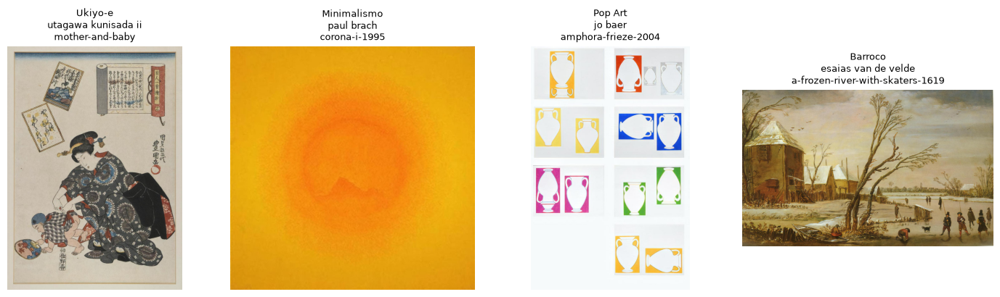

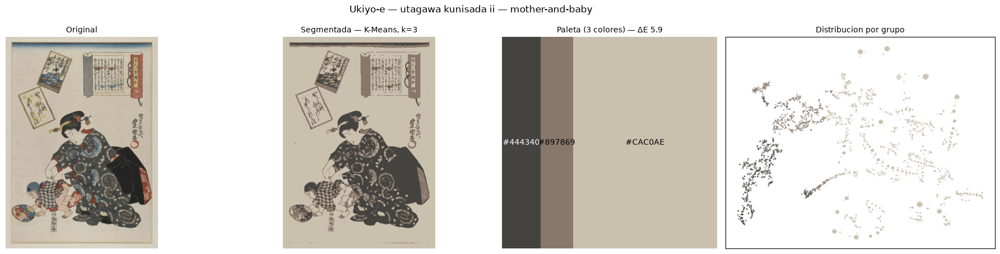

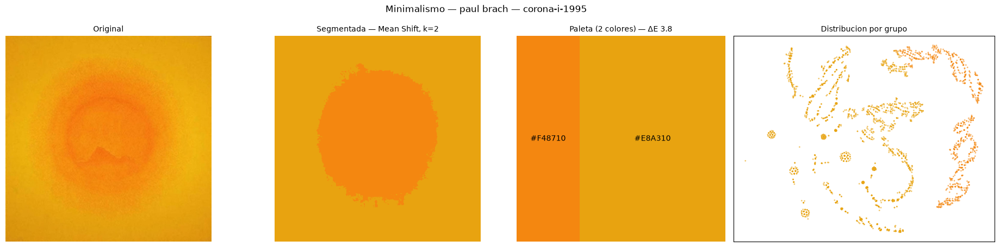

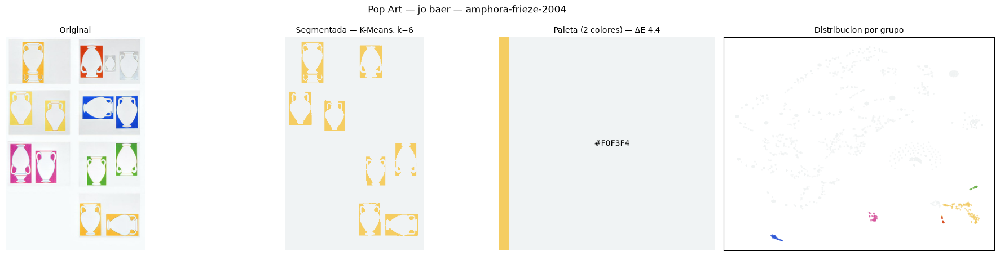

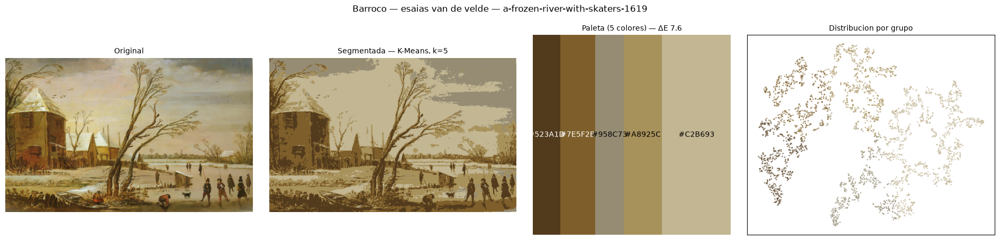


Conjunto de trabajo: k entre 2 y 5, ΔE entre 3.2 y 9.9

utagawa kunisada ii | mother-and-baby: K-Means, k=3, paleta de 3 colores, ΔE=5.89, cobertura=100.0%
paul brach | corona-i-1995: Mean Shift, k=2, paleta de 2 colores, ΔE=3.84, cobertura=100.0%
jo baer | amphora-frieze-2004: K-Means, k=6, paleta de 2 colores, ΔE=4.42, cobertura=94.7%
    -> 4 grupo(s) fusionados o descartados; 5.3% de la obra sin representar en la paleta
esaias van de velde | a-frozen-river-with-skaters-1619: K-Means, k=5, paleta de 5 colores, ΔE=7.65, cobertura=100.0%


In [ ]:
# Aplicacion del metodo a generos que no intervinieron en ninguna decision de diseno.

# Nombres exactos tal como aparecen en el catalogo. Ojo: es "Ukiyo e", sin guion.
GENEROS_NO_VISTOS = {
    "Ukiyo e":    "Ukiyo-e",
    "Minimalism": "Minimalismo",
    "Pop Art":    "Pop Art",
    "Baroque":    "Barroco",
}

filas_nuevas = []

for genero, genero_es in GENEROS_NO_VISTOS.items():
    genero_norm = normalizar_texto(genero)

    # Se usa la columna 'generos_norm', ya normalizada en cargar_catalogo:
    # normalizar aqui las 80.043 filas de nuevo seria trabajo repetido.
    del_genero = catalogo[
        catalogo["generos_norm"].apply(lambda gs: genero_norm in gs)
    ]

    if del_genero.empty:
        raise ValueError(f"Sin obras para el genero {genero!r} en el catalogo.")

    # Una obra por artista distinto, para no sortear dos del mismo autor
    muestra = (
        del_genero.groupby("artista_norm", sort=False)
        .head(1)
        .sample(n=min(2, del_genero["artista_norm"].nunique()),
                random_state=SEMILLA)
    )

    for _, obra in muestra.iterrows():
        filas_nuevas.append({
            "genero": genero,
            "genero_es": genero_es,
            "artista": obra["artista_norm"],
            "obra": obra["description"],
            "filename": obra["filename"],
            "ancho": None,
            "alto": None,
        })

obras_nuevas = pd.DataFrame(filas_nuevas).reset_index(drop=True)

# La primera de cada genero se analiza; la segunda queda de reserva
reserva_nuevas = obras_nuevas.groupby("genero", sort=False).tail(1).reset_index(drop=True)
obras_nuevas = obras_nuevas.groupby("genero", sort=False).head(1).reset_index(drop=True)

print(f"Obras nuevas a analizar: {len(obras_nuevas)}  |  en reserva: {len(reserva_nuevas)}")

obras_nuevas = descargar_obras(obras_nuevas)
display(verificar_rutas(obras_nuevas))

mostrar_galeria(obras_nuevas, columnas=4)

resultados_nuevos = {}

for _, fila in obras_nuevas.iterrows():
    clave = f"{fila['artista']} | {fila['obra']}"
    resultados_nuevos[clave] = analizar_obra(fila["ruta_local"])

    mostrar_resultado(
        resultados_nuevos[clave],
        titulo=f"{fila['genero_es']} — {fila['artista']} — {fila['obra']}",
    )

# 6. Comparacion con el rango observado en el conjunto de trabajo
print(f"\nConjunto de trabajo: k entre {comparacion['k'].min()} y "
        f"{comparacion['k'].max()}, ΔE entre "
        f"{comparacion['delta_e_medio'].min():.1f} y "
        f"{comparacion['delta_e_medio'].max():.1f}\n")

for clave, resultado in resultados_nuevos.items():
    s = resultado["seleccion"]
    cobertura = resultado["muestrario"]["proporcion_bruta"].sum()

    print(f"{clave}: {s['algoritmo']}, k={int(s['k'])}, "
          f"paleta de {len(resultado['muestrario'])} colores, "
          f"ΔE={s['delta_e_medio']:.2f}, cobertura={cobertura:.1%}")

    # El modelo puede hallar mas grupos de los que sobreviven al post-proceso:
    # la fusion por cercania une los casi identicos y el filtro descarta los que
    # ocupan menos de proporcion_minima. La cobertura dice cuanta obra quedo
    # representada, y una diferencia grande entre k y el tamano de la paleta
    # senala acentos cromaticos pequenos que la paleta no recoge.
    if len(resultado["muestrario"]) < int(s["k"]):
        perdidos = int(s["k"]) - len(resultado["muestrario"])
        print(f"    -> {perdidos} grupo(s) fusionados o descartados; "
              f"{1 - cobertura:.1%} de la obra sin representar en la paleta")

### Resultado de la prueba de generalización

De las cuatro obras nuevas, K-Means fue elegido en tres y Mean Shift en una, una proporción parecida a la del conjunto de trabajo. El número de grupos fue de 2 a 6, y conviene destacar que Jo Baer alcanzó $k=6$, por encima del máximo de 5 observado en el conjunto original: el método no se limitó al rango que ya conocía, sino que propuso una solución más rica cuando la obra lo pidió.

En tres de las cuatro la paleta representa el 100 % de la obra. El caso interesante es el cuarto.

En Amphora Frieze de Jo Baer el modelo encontró 6 grupos, pero la paleta final quedó en 2 y dejó un 5,3 % de la obra sin representar. Al revisar los pesos se entiende por qué: es un lienzo casi blanco —el 90 % de los píxeles— con bandas finas de color en los bordes. El amarillo ocupa un 4,5 % y sobrevive; el magenta, el azul, el verde y el naranja ocupan entre 0,7 % y 1,9 % cada uno y caen por debajo del umbral del 2 % fijado en §4.2.

Conviene precisar la causa, porque no es la que parece a primera vista. Estos colores no se pierden por el redimensionamiento. Al asignar los píxeles de la imagen a resolución original (1382×2122) a esos mismos grupos, ocupan un 5,51 % frente al 5,33 % que ocupan en la versión reducida a 400 px: una diferencia de dos décimas de punto. Reducir la imagen conserva las proporciones de área casi exactamente, que es precisamente el objetivo de preservar la relación de aspecto en §2.1. Los colores se pierden por el filtro de proporción mínima, no por la preparación.

Esto matiza además una intuición razonable pero equivocada: el filtro discrimina por área, no por saturación. Los colores descartados de Jo Baer son intensos ($a^\ast$ hasta 58, $b^\ast$ hasta −71), mientras que la gama apagada del barroco de van de Velde se recogió entera. Lo que decide si un color entra en la paleta no es cuán vivo sea, sino cuánta superficie ocupe.

El caso confirma en la práctica la limitación anticipada en §4.2: un acento cromático pequeño pero deliberado del artista queda fuera de la paleta. En una obra donde esos acentos son el motivo, el resultado es fiel en superficie —con un $\Delta E$ de 4,42, de los más bajos del análisis— pero incompleto en intención.

<a id="seccion-7"></a>
# 7. Conclusiones

### Sobre el número de grupos

El número de grupos seleccionado recorre el rango $k \in [2, 6]$ sumando el conjunto de trabajo y las obras de la prueba de generalización. No es un valor fijo: cambia con cada imagen, que era el objetivo del proyecto.

En el extremo inferior están las obras que esperábamos. El minimalismo de Paul Brach y el Color Field de Barnett Newman se resolvieron con 2 colores, y el Rothko con 3: lienzos de campos planos y extensos, con muy pocas transiciones.

El extremo superior lo ocupa el Pop Art de Jo Baer con $k=6$, y aquí conviene precisar qué ocurrió. El algoritmo sí seleccionó más grupos —de hecho el máximo de todo el análisis, por encima del 5 que fue el techo del conjunto de trabajo—; lo que redujo la paleta a 2 colores fue el post-proceso del muestrario, no la agrupación. Los cuatro grupos ausentes ocupan entre 0,7 % y 1,9 % de la obra cada uno y caen bajo el umbral de proporción mínima.

Una relación que parecía evidente no se sostuvo. Cabía esperar que las obras más coloridas necesitaran más grupos, pero al cruzar el $k$ con las amplitudes cromáticas medidas en §2.5 la correlación resulta débil ($r = +0{,}29$). Los contraejemplos son claros: De Kooning tiene la mayor extensión cromática del conjunto (118,5) y se resolvió con 4 grupos; Rothko, con 90,4, bastó con 3; y el Picasso, un grabado prácticamente en blanco y negro con una extensión de apenas 25,2, obtuvo el $k$ más alto del conjunto de trabajo.

Lo que sí muestra una tendencia más marcada es la amplitud de luminosidad: $r = +0{,}57$ con el recorrido de $L^\ast$. Encaja con lo observado en §5.3, donde la primera componente principal resultó ser precisamente la luminosidad, con correlación 1,00. El eje que más varía dentro de una obra es casi siempre el de claro a oscuro, de modo que es el que más grupos exige para representarse con fidelidad. El Picasso lo confirma: recorre el rango completo de $L^\ast$ y necesita cinco niveles de gris pese a no tener color, mientras que el Rothko, con la menor amplitud de luminosidad (42,2), se resuelve con tres pese a ser muy saturado.

### Sobre los algoritmos

K-Means fue el algoritmo seleccionado con mayor frecuencia: 7 de las 8 obras del conjunto de trabajo y 3 de las 4 de la prueba de generalización. Mean Shift ganó las dos restantes y GMM no fue elegido en ninguna.

El resultado hay que interpretarlo con cuidado, porque parte de la ventaja de K-Means es estructural y no refleja una superioridad en reconocer colores. La razón está en la coincidencia entre lo que el algoritmo optimiza y lo que nuestras métricas miden: K-Means minimiza la suma de distancias cuadráticas de cada punto a su centroide, y Silhouette, Davies-Bouldin y Calinski-Harabasz se construyen las tres sobre razones entre la dispersión interna de los grupos y la separación entre ellos, es decir, sobre la misma cantidad. A esto se añade que el piso de fidelidad de §3.3 se calcula sobre la curva de $\Delta E$, que en CIELAB es la función objetivo de K-Means.

GMM pierde por el motivo complementario. Optimiza la verosimilitud de una mezcla gaussiana con covarianza libre, lo que produce grupos elipsoidales y alargados; esa forma describe mejor un degradado, pero puntúa peor en métricas basadas en razones de varianza. Su criterio natural sería BIC o AIC, que no son comparables con los de los otros dos algoritmos y por eso no pudieron usarse para elegir entre ellos.

Con solo dos victorias de Mean Shift no es posible caracterizar cuándo resulta preferible, y conviene no dar por buena la explicación intuitiva: el minimalismo de Paul Brach encaja con la idea de "pocos colores muy marcados", pero el bodegón de Braque es una de las obras cromáticamente más ricas del conjunto, con la segunda mayor variedad de tonos. La muestra es demasiado pequeña para extraer una regla.

Lo que sí puede afirmarse es que la comparación no fue del todo equilibrada. Mean Shift aporta 6 configuraciones frente a las 11 de K-Means y GMM, y como no recibe $k$ sino que lo produce, muchas de las suyas caen por debajo del piso de fidelidad y quedan descartadas antes de competir: en Pollock solo una configuración de Mean Shift superaba el piso, frente a siete de K-Means. Una comparación más justa exigiría densificar su rejilla de cuantiles.

### Sobre la tensión entre métricas internas y representatividad

El hallazgo metodológico central: **una partición mejor según las métricas internas no produce
necesariamente una paleta más representativa**. Silhouette, aplicada sola, habría devuelto dos
colores para casi todas las obras. Explicar cómo el componente de fidelidad cromática del criterio
de §3.3 resolvió esa tensión y cuánto cambió el $k$ resultante.

El caso de Amphora Frieze plantea una pregunta legítima: si a simple vista hay colores que ocupan poca superficie pero resultan claramente representativos de la obra, ¿constituye un sesgo que el método los descarte?

Lo es, pero conviene precisar de qué tipo. El umbral de proporción mínima es una decisión de diseño declarada en §4.2 y aplicada por igual a todas las imágenes, no un ajuste hecho a posteriori para favorecer un resultado. Un sesgo declarado y constante es defendible; lo que no lo sería es bajarlo solo para la obra de Jo Baer, porque eso convertiría el método en una serie de ajustes manuales, justo lo que el proyecto busca evitar.

La segunda pregunta es más de fondo: ¿qué debe entenderse por representativo? Hay dos lecturas, y el objetivo del proyecto elige una. Hablamos de extraer los tonos dominantes, y "dominante" es un criterio de superficie: un color domina si ocupa área. Bajo esa definición el resultado de Jo Baer es correcto — su obra está dominada por el blanco. La lectura alternativa, representar la intención del artista, incluiría los acentos cromáticos por pequeños que fueran, pero es un objetivo distinto y exigiría otro método.

Dicho esto, al medir el efecto real del umbral aparece algo que matiza la decisión. Aplicando el método con umbrales de 2 %, 1 %, 0,5 % y 0 % sobre las nueve obras analizadas, el tamaño de la paleta no cambia en ocho de ellas, ni siquiera eliminando el filtro por completo. La única que varía es Amphora Frieze, que pasa de 2 colores a 6 al bajar el umbral a 0,5 %.

Es decir, el filtro apenas interviene en el resto del conjunto: la fusión por cercanía ya elimina los colores redundantes, y con valores de $k$ entre 2 y 6 no llegan a formarse grupos marginales. Su único efecto observable es precisamente el caso en que perjudica. Un umbral de 0,5 % habría recuperado los cuatro acentos de Jo Baer sin alterar ninguna otra paleta.

No modificamos el valor porque los resultados presentados se obtuvieron con él.

### Limitaciones

- El umbral del 2 % descarta acentos cromáticos pequeños pero deliberados del artista.
- Se emplea $\Delta E_{76}$, la distancia euclidiana simple en CIELAB. $\Delta E_{2000}$ corrige
  ciertas no uniformidades residuales, sobre todo en la región de los azules saturados, pero no es
  una métrica euclidiana y no se puede optimizar directamente con estos algoritmos.
- La proyección t-SNE no es determinista fuera de la semilla fijada y sus distancias globales no
  son interpretables.
- El muestreo de 20.000 píxeles estima bien las proporciones dominantes, pero puede pasar por alto
  colores que ocupen una fracción muy pequeña del lienzo.
- La paleta ignora la posición de los píxeles, de modo que no distingue entre un color repartido
  por toda la obra y otro concentrado en una esquina.